## importing libraries

In [1]:
try:
  import gradio as gr
  import accelerate
  import torchmetrics
  import datasets
except ModuleNotFoundError:
  !pip install -U gradio accelerate
  !pip install -U torchmetrics[detection]

  import gradio as gr
  import torchmetrics
  import accelerate
  import datasets
  import pycocotools
import numpy as np
import torchvision
import torch
import transformers

print(f"Using transformers version: {transformers.__version__}")
print(f"Using datasets version: {datasets.__version__}")
print(f"Using torch version: {torch.__version__}")
print(f"Using torchmetrics version: {torchmetrics.__version__}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.7/19.7 MB 75.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 6.9 MB/s eta 0:00:00
  Attempting uninstall: gradio-client
    Found existing installation: gradio_client 1.14.0
    Uninstalling gradio_client-1.14.0:
      Successfully uninstalled gradio_client-1.14.0
  Attempting uninstall: gradio
    Found existing installation: gradio 5.50.0
    Uninstalling gradio-5.50.0:
      Successfully uninstalled gradio-5.50.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 27.0 MB/s eta 0:00:00
Using transformers version: 5.0.0
Using datasets version: 4.0.0
Using torch version: 2.10.0+cu128
Using torchmetrics version: 1.9.0


## importing dataset

In [2]:
import datasets

dataset = datasets.load_dataset("mrdbourke/trashify_manual_labelled_images")
dataset

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00003.parquet:   0%|          | 0.00/334M [00:00<?, ?B/s]

data/train-00001-of-00003.parquet:   0%|          | 0.00/348M [00:00<?, ?B/s]

data/train-00002-of-00003.parquet:   0%|          | 0.00/345M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1128 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 1128
    })
})

In [ ]:
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 1128
    })
})

In [ ]:
dataset["train"][42] #

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 745,
 'annotations': {'file_name': ['094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg',
   '094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg',
   '094f4f41-dc07-4704-96d7-8d5e82c9edb9.jpeg'],
  'image_id': [745, 745, 745],
  'category_id': [5, 1, 0],
  'bbox': [[333.1000061035156,
    611.2000122070312,
    244.89999389648438,
    321.29998779296875],
   [504.0, 612.9000244140625, 451.29998779296875, 650.7999877929688],
   [202.8000030517578,
    366.20001220703125,
    532.9000244140625,
    555.4000244140625]],
  'iscrowd': [0, 0, 0],
  'area': [78686.3671875, 293706.03125, 295972.65625]},
 'label_source': 'manual_prodigy_label',
 'image_source': 'manual_taken_photo'}

## getting categories

In [3]:
categories = dataset["train"].features["annotations"]["category_id"]
categories

List(ClassLabel(names=['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm']))

In [4]:
categories.feature.names

['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm']

In [5]:
## creating and map
id2label = {key:val for key,val in enumerate(categories.feature.names)}
id2label

{0: 'bin',
 1: 'hand',
 2: 'not_bin',
 3: 'not_hand',
 4: 'not_trash',
 5: 'trash',
 6: 'trash_arm'}

In [6]:
label2id = {val:key for key,val in id2label.items()}
label2id

{'bin': 0,
 'hand': 1,
 'not_bin': 2,
 'not_hand': 3,
 'not_trash': 4,
 'trash': 5,
 'trash_arm': 6}

In [ ]:
dataset["train"][42]["annotations"]["bbox"] , dataset["train"][42]["annotations"]["category_id"]

([[333.1000061035156,
   611.2000122070312,
   244.89999389648438,
   321.29998779296875],
  [504.0, 612.9000244140625, 451.29998779296875, 650.7999877929688],
  [202.8000030517578,
   366.20001220703125,
   532.9000244140625,
   555.4000244140625]],
 [5, 1, 0])

In [ ]:
print("[INFO] label name for 42th image :",[id2label[x]for x in dataset["train"][42]["annotations"]["category_id"]])
print("[INFO] Bounding boxes for that all labels in *xyxy* format",dataset["train"][42]["annotations"]["bbox"])

[INFO] label name for 42th image : ['trash', 'hand', 'bin']
[INFO] Bounding boxes for that all labels in *xyxy* format [[333.1000061035156, 611.2000122070312, 244.89999389648438, 321.29998779296875], [504.0, 612.9000244140625, 451.29998779296875, 650.7999877929688], [202.8000030517578, 366.20001220703125, 532.9000244140625, 555.4000244140625]]


## defining color palette

In [7]:
## so this dataset as 7 labels so 7 individual color by combination of  (r,g,b) format
# Make colour dictionary
colour_palette = {
    'bin': (0, 0, 224),         # Bright Blue (High contrast with greenery) in format (red, green, blue)
    'not_bin': (255, 80, 80),   # Light Red to indicate negative class

    'hand': (148, 0, 211),      # Dark Purple (Contrasts well with skin tones)
    'not_hand': (255, 80, 80),  # Light Red to indicate negative class

    'trash': (0, 255, 0),       # Bright Green (For trash-related items)
    'not_trash': (255, 80, 80), # Light Red to indicate negative class

    'trash_arm': (255, 140, 0), # Deep Orange (Highly visible)
}

## creating and random sample plot with bounding boxes

In [ ]:
dataset.shape

{'train': (1128, 5)}

In [ ]:
import random
random_sample_index = random.choice(range(0,dataset["train"].shape[0]))
print("[INFO] Random sample index :",random_sample_index)

[INFO] Random sample index : 1009


In [8]:
def half_boxes(bboxes):
  if isinstance(bboxes,list):
    for boxes in bboxes:
      if isinstance(boxes,list):
        return [[coordinate // 2 for coordinate in box] for box in bboxes]
      else:
        return [coordinate // 2 for coordinate in bboxes]
  if isinstance(bboxes, np.ndarray):
        return (bboxes // 2)

  if isinstance(bboxes, torch.Tensor):
        return (bboxes // 2)

In [ ]:
half_boxes([100,100,100,100])

[50, 50, 50, 50]

In [ ]:
half_boxes([[100,100,100,100],[200,200,200,200]])

[[50, 50, 50, 50], [100, 100, 100, 100]]

In [9]:
import PIL
def half_image(image:PIL.Image) -> PIL.Image:
  return image.resize(size=(image.size[0]//2,image.size[1]//2))

In [ ]:
image_test = dataset["train"][42]["image"]
image_test_half = half_image(image_test)
print(f"[INFO] Original image size: {image_test.size} | Half image size: {image_test_half.size}")

boxes_test_list = [100, 100, 100, 100]
print(f"[INFO] Original boxes: {boxes_test_list} | Half boxes: {half_boxes(boxes_test_list)}")

boxes_test_torch = torch.tensor([100.0, 100.0, 100.0, 100.0])
print(f"[INFO] Original boxes: {boxes_test_torch} | Half boxes: {half_boxes(boxes_test_torch)}")

[INFO] Original image size: (960, 1280) | Half image size: (480, 640)
[INFO] Original boxes: [100, 100, 100, 100] | Half boxes: [50, 50, 50, 50]
[INFO] Original boxes: tensor([100., 100., 100., 100.]) | Half boxes: tensor([50., 50., 50., 50.])


## Plotting boxes on a single image step by step

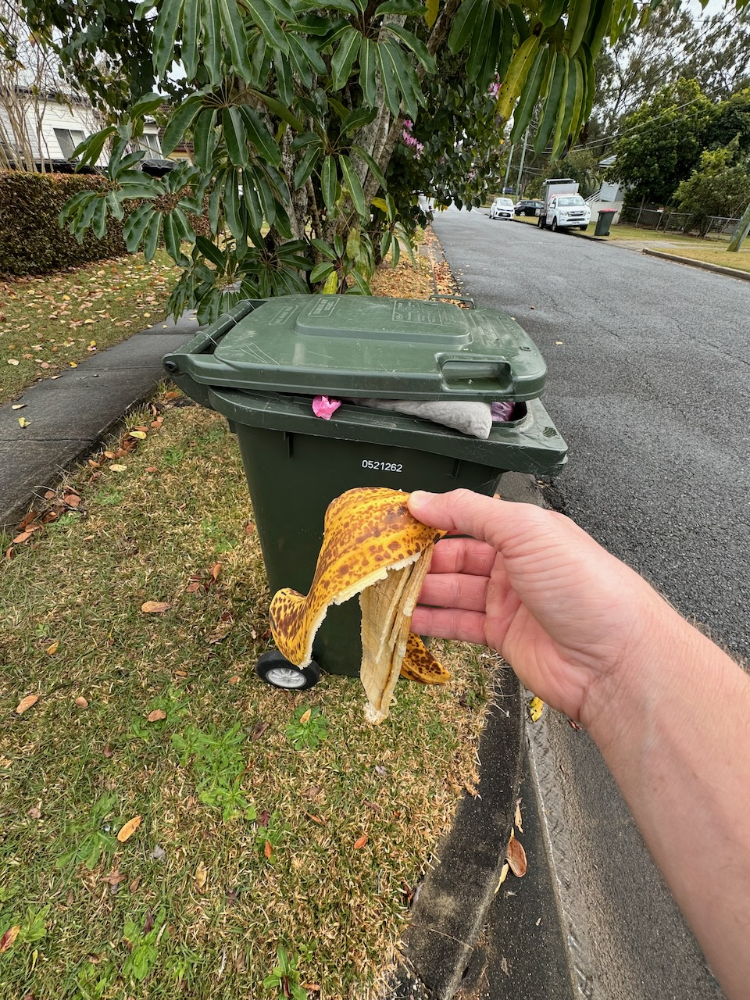

In [ ]:
dataset["train"][42]["image"]

In [10]:
random_sample_index = random.choice(range(0,dataset["train"].shape[0]))
print("[INFO] Random sample index :",random_sample_index)
# random sample
random_sample = dataset["train"][random_sample_index]
# random sample images and bboxes
random_sample_image = random_sample["image"]
random_sample_boxes = random_sample["annotations"]["bbox"]
# half random sample image and bboxes
half_random_image = half_image(random_sample_image)
half_random_boxes = half_boxes(random_sample_boxes)
# random sample boxes form xywh to xyxy format
boxes_xyxy = torchvision.ops.box_convert(torch.tensor(half_random_boxes),in_fmt="xywh",out_fmt="xyxy")
# getting labels
random_sample_labels = [id2label[x]for x in dataset["train"][random_sample_index]["annotations"]["category_id"]]
random_sample_color_pal = [colour_palette[label_name] for label_name in random_sample_labels]
# plotting image
torchvision.transforms.functional.to_pil_image(
    pic = torchvision.utils.draw_bounding_boxes(
        image = torchvision.transforms.functional.pil_to_tensor(half_random_image),
        boxes = boxes_xyxy,
        colors = random_sample_color_pal,
        width=2,
        label_colors  = random_sample_color_pal,
        labels = random_sample_labels
    )
)

NameError: name 'random' is not defined

In [ ]:
categories.feature.names # seven labels

['bin', 'hand', 'not_bin', 'not_hand', 'not_trash', 'trash', 'trash_arm']

## Now lets see the normalized version of the bboxes and the color pal

In [11]:
def normalize_color_pal(color:tuple):
  return tuple(x/255.0 for x in color)

In [ ]:
normalize_color_pal(colour_palette["bin"])

(0.0, 0.0, 0.8784313725490196)

In [ ]:
# here thier is and formula where x_absolute_value = image_width * normalized_x , y_absolute_value = image_height * normalized_y
# so we want the normalized value

## Pretrained model name : [ RT-DETRv2: Improved Baseline with Bag-of-Freebies for Real-Time Detection Transformer.](https://arxiv.org/abs/2407.17140)

In [12]:
from transformers import AutoModelForObjectDetection

In [13]:
MODEL_PATH = "PekingU/rtdetr_v2_r50vd"
model = AutoModelForObjectDetection.from_pretrained(
    pretrained_model_name_or_path = MODEL_PATH,
    id2label = id2label,
    label2id = label2id,
    ignore_mismatched_sizes = True # just to finetune with our class
)

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/172M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/770 [00:00<?, ?it/s]

The tied weights mapping and config for this model specifies to tie class_embed.0.bias to model.decoder.class_embed.1.bias, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie class_embed.0.weight to model.decoder.class_embed.1.weight, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie class_embed.0.bias to model.decoder.class_embed.2.bias, but both are present in the checkpoints, so we will NOT tie them. You should update the config with `tie_word_embeddings=False` to silence this warning
The tied weights mapping and config for this model specifies to tie class_embed.0.weight to model.decoder.class_embed.2.weight, but both are present in the checkpoints,

In [14]:
# writing and function to create model
def create_model():
  MODEL_PATH = "PekingU/rtdetr_v2_r50vd"
  model = AutoModelForObjectDetection.from_pretrained(
      pretrained_model_name_or_path = MODEL_PATH,
      id2label = id2label,
      label2id = label2id,
      ignore_mismatched_sizes = True # just to finetune with our class
  )
  return model

In [ ]:
model

RTDetrV2ForObjectDetection(
  (model): RTDetrV2Model(
    (backbone): RTDetrV2ConvEncoder(
      (model): RTDetrResNetBackbone(
        (embedder): RTDetrResNetEmbeddings(
          (embedder): Sequential(
            (0): RTDetrResNetConvLayer(
              (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
            (1): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
            (2): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
          )
          (pooler)

In [ ]:
model.class_embed

ModuleList(
  (0-5): 6 x Linear(in_features=256, out_features=7, bias=True)
)

In [ ]:
model.bbox_embed

ModuleList(
  (0-5): 6 x RTDetrV2MLPPredictionHead(
    (layers): ModuleList(
      (0-1): 2 x Linear(in_features=256, out_features=256, bias=True)
      (2): Linear(in_features=256, out_features=4, bias=True)
    )
  )
)

In [ ]:
# model(random_sample_image)
# model forward layer include the pixel mask and pixel values not hte image
# so the pixel mask and values are generated form image processor layer

In [ ]:
print("[INFO] Trainable parameters :",sum([p.numel() for p in model.parameters() if p.requires_grad]))
print("[INFO] NON Trainable parameters :",sum([p.numel() for p in model.parameters() if not p.requires_grad]))
print("[INFO] Total parameters :",sum([p.numel() for p in model.parameters()]))

[INFO] Trainable parameters : 42069302
[INFO] NON Trainable parameters : 0
[INFO] Total parameters : 42069302


## Creating Image Processor : To generate pixel values and pixel mask

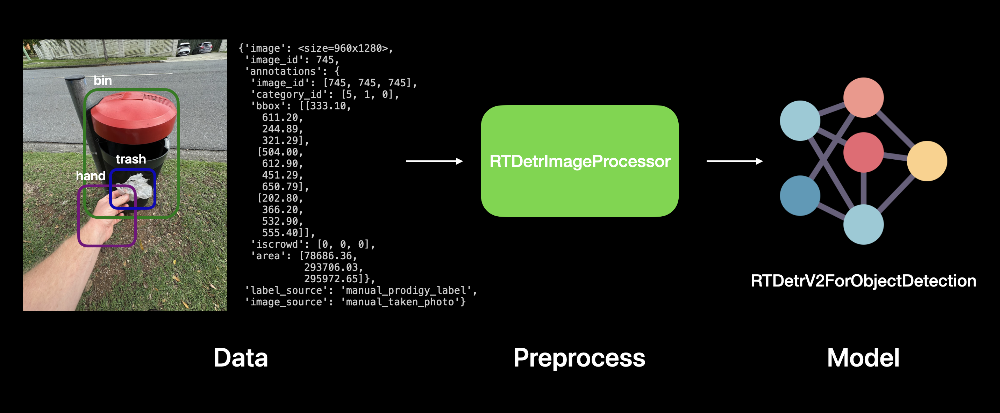

In [15]:
from transformers import AutoImageProcessor

In [ ]:
image_processor = AutoImageProcessor.from_pretrained(MODEL_PATH)
image_processor

preprocessor_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

The image processor of type `RTDetrImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


RTDetrImageProcessorFast {
  "data_format": "channels_first",
  "do_convert_annotations": true,
  "do_normalize": false,
  "do_pad": false,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 640,
    "width": 640
  }
}

In [ ]:
# this is how he want and trained
image_processor

RTDetrImageProcessorFast {
  "data_format": "channels_first",
  "do_convert_annotations": true,
  "do_normalize": false,
  "do_pad": false,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 640,
    "width": 640
  }
}

In [16]:
## converting according to our use
IMAGE_SIZE = 640
image_processor = AutoImageProcessor.from_pretrained(
    pretrained_model_name_or_path=MODEL_PATH,
    do_convert_annotations = True, # this will convert the boxes to cx,cy,w,h format
    do_pad = True,
    format = "coco_detection",
    size = {"shortest_edge":IMAGE_SIZE,"longest_edge":IMAGE_SIZE},
    use_fast = True,
    return_segmentation_masks=True
)

preprocessor_config.json:   0%|          | 0.00/444 [00:00<?, ?B/s]

In [ ]:
image_processor.size

{'shortest_edge': 640, 'longest_edge': 640}

In [ ]:
dataset["train"][random_sample_index]

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 957,
 'annotations': {'file_name': ['7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg'],
  'image_id': [957, 957, 957, 957, 957, 957],
  'category_id': [5, 1, 0, 2, 4, 0],
  'bbox': [[414.79998779296875, 525.5, 92.5, 78.9000015258789],
   [487.6000061035156,
    539.0999755859375,
    222.89999389648438,
    230.60000610351562],
   [51.20000076293945, 333.1000061035156, 633.0, 685.0999755859375],
   [826.0, 196.1999969482422, 128.5, 171.8000030517578],
   [446.6000061035156, 251.0, 62.20000076293945, 40.900001525878906],
   [323.79998779296875,
    257.1000061035156,
    36.400001525878906,
    43.900001525878906]],
  'iscrowd': [0, 0, 0, 0, 0, 0],
  'area': [7298.25,
   51400.73828125,


In [ ]:
## now lets check can we get the pixel values and pixel mask
# random_sample_processed = image_processor.preprocess(
#     images = random_sample["image"],
#     annotations = random_sample["annotations"]
# )

# ---------------------------------------------------------------------------------
# Okay so here we have and error and it is related to annotations are not according to coco format
# so lets make annotations in coco format

In [ ]:
## lets see without passing annotations i.e just image what we get
image_processed = image_processor.preprocess(
    images = random_sample["image"],
    annotations = None,
    masks_path = None,
    return_tensors = "pt"
)

In [ ]:
image_processed

{'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0863, 0.0863, 0.0863,  ..., 0.3294, 0.3294, 0.3255],
          [0.0902, 0.0824, 0.0863,  ..., 0.3255, 0.3294, 0.3294],
          [0.0902, 0.0902, 0.0980,  ..., 0.3255, 0.3294, 0.3294]],

         [[0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          [0.0118, 0.0118, 0.0118,  ..., 0.0078, 0.0078, 0.0078],
          ...,
          [0.0902, 0.0902, 0.0902,  ..., 0.2471, 0.2471, 0.2431],
          [0.0941, 0.0863, 0.0902,  ..., 0.2431, 0

In [ ]:
# Uncomment to inspect all preprocessed pixel values
# print(random_sample_preprocessed_image_only["pixel_values"][0])

print(f"[INFO] Original image shape: {random_sample['image'].size} -> [width, height]")
print(f"[INFO] Preprocessed image shape: {image_processed['pixel_values'].shape} -> [batch_size, colour_channles, height, width]")

[INFO] Original image shape: (960, 1280) -> [width, height]
[INFO] Preprocessed image shape: torch.Size([1, 3, 640, 480]) -> [batch_size, colour_channles, height, width]


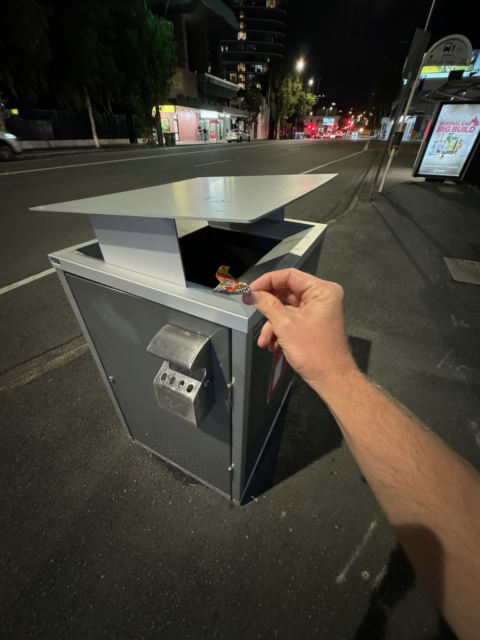

In [ ]:
import torchvision.transforms.functional as F
F.to_pil_image(image_processed['pixel_values'].squeeze(0))

In [ ]:
# Taking that image processor output to model
outputs = model(pixel_values=image_processed["pixel_values"],pixel_mask=image_processed["pixel_mask"])

In [ ]:
outputs.keys()

odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'intermediate_hidden_states', 'intermediate_logits', 'intermediate_reference_points', 'encoder_last_hidden_state', 'init_reference_points', 'enc_topk_logits', 'enc_topk_bboxes', 'enc_outputs_class', 'enc_outputs_coord_logits'])

In [ ]:
outputs.logits , outputs.logits.shape
# [1,300,7] = 1 :batch size , 7: num_output_class , 300:maximum number of objects can predict my the model in singleimage

(tensor([[[-1.3963, -2.1546, -0.5630,  ..., -1.3910, -4.5759, -2.6793],
          [-0.8724, -0.1136, -1.0729,  ..., -1.7158, -2.4033, -4.0500],
          [-0.5710, -0.9392, -0.0578,  ..., -1.7952, -2.5254, -3.8020],
          ...,
          [-0.7969, -0.9844, -0.9309,  ..., -1.5689, -2.6185, -3.8998],
          [-0.7902, -1.0275, -0.9023,  ..., -1.5220, -3.1286, -3.5924],
          [-0.9278, -0.0461,  0.2775,  ..., -1.8700, -2.8249, -3.5674]]],
        grad_fn=<SelectBackward0>),
 torch.Size([1, 300, 7]))

In [ ]:
logits = outputs.logits
logits.sigmoid()

tensor([[[0.1984, 0.1039, 0.3628,  ..., 0.1993, 0.0102, 0.0642],
         [0.2948, 0.4716, 0.2549,  ..., 0.1524, 0.0829, 0.0171],
         [0.3610, 0.2811, 0.4856,  ..., 0.1424, 0.0741, 0.0218],
         ...,
         [0.3107, 0.2720, 0.2827,  ..., 0.1724, 0.0680, 0.0198],
         [0.3121, 0.2636, 0.2886,  ..., 0.1792, 0.0419, 0.0268],
         [0.2834, 0.4885, 0.5689,  ..., 0.1335, 0.0560, 0.0275]]],
       grad_fn=<SigmoidBackward0>)

In [ ]:
logits = logits.sigmoid()
score,labels = logits.max(-1)

In [ ]:
score.shape

torch.Size([1, 300])

In [ ]:
labels.shape

torch.Size([1, 300])

In [ ]:
labels

tensor([[2, 1, 2, 2, 2, 0, 2, 0, 2, 0, 2, 2, 0, 2, 1, 0, 2, 2, 1, 2, 2, 0, 1, 1,
         1, 2, 2, 2, 2, 0, 0, 1, 2, 1, 2, 0, 2, 2, 2, 2, 0, 1, 5, 2, 2, 2, 0, 0,
         1, 2, 0, 2, 1, 2, 2, 1, 2, 2, 0, 2, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2,
         2, 2, 2, 0, 1, 1, 2, 1, 0, 2, 0, 4, 0, 2, 0, 2, 1, 2, 1, 2, 2, 1, 2, 1,
         1, 2, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 2, 0, 1, 2, 2, 2, 0, 2, 2, 1,
         1, 2, 2, 2, 0, 3, 1, 1, 2, 1, 0, 1, 1, 1, 2, 2, 2, 0, 0, 1, 2, 1, 4, 1,
         1, 2, 2, 1, 1, 2, 2, 1, 2, 2, 1, 2, 0, 1, 0, 1, 2, 1, 2, 1, 0, 1, 2, 1,
         1, 0, 2, 2, 2, 1, 2, 0, 1, 1, 1, 4, 1, 1, 2, 2, 2, 2, 1, 2, 1, 0, 2, 0,
         1, 1, 1, 2, 0, 0, 0, 0, 0, 2, 0, 2, 0, 1, 2, 0, 2, 0, 2, 0, 0, 1, 2, 0,
         0, 1, 2, 2, 0, 2, 2, 2, 2, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 2, 1, 1, 0, 1,
         2, 2, 2, 1, 0, 0, 1, 0, 2, 0, 1, 0, 0, 0, 2, 1, 2, 0, 2, 1, 2, 2, 1, 2,
         1, 2, 1, 2, 2, 1, 2, 1, 0, 4, 2, 1, 0, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2,
         0, 1, 0, 0, 0, 5, 2

In [ ]:
outputs.pred_boxes , outputs.pred_boxes.shape
# the format of the box prediction [cx, cy, w, h]

(tensor([[[0.3624, 0.5816, 0.3842, 0.4057],
          [0.8747, 0.2792, 0.0228, 0.0100],
          [0.0843, 0.0320, 0.0687, 0.0523],
          ...,
          [0.4977, 0.1649, 0.0334, 0.0245],
          [0.8898, 0.1851, 0.0384, 0.0747],
          [0.7464, 0.6846, 0.0230, 0.0331]]], grad_fn=<SelectBackward0>),
 torch.Size([1, 300, 4]))

In [ ]:
# lets plot the image
boxes_xyxy = torchvision.ops.box_convert(outputs.pred_boxes.squeeze(0),in_fmt="xywh",out_fmt="xyxy")

In [ ]:
boxes_xyxy

tensor([[0.3624, 0.5816, 0.7466, 0.9873],
        [0.8747, 0.2792, 0.8976, 0.2893],
        [0.0843, 0.0320, 0.1530, 0.0843],
        ...,
        [0.4977, 0.1649, 0.5311, 0.1894],
        [0.8898, 0.1851, 0.9282, 0.2597],
        [0.7464, 0.6846, 0.7694, 0.7177]], grad_fn=<StackBackward0>)

In [ ]:
random_sample_labels = [id2label[x] for x in labels.squeeze(0).tolist()]
random_sample_color_pal = [colour_palette[x] for x in random_sample_labels]

In [ ]:
torchvision.transforms.functional.to_pil_image(
    pic = torchvision.utils.draw_bounding_boxes(
        image = torchvision.transforms.functional.pil_to_tensor(half_image(random_sample["image"])),
        boxes = boxes_xyxy,
        colors = random_sample_color_pal,
        width=2,
        label_colors  = random_sample_color_pal,
        labels = random_sample_labels
    )
)

# image is poor the post_process_object will make it looking coll
## lets first focus on annotations

## Fixing Annotations

In [ ]:
# ## coco format
# # COCO format, see: https://cocodataset.org/#format-data
# [{
#     "image_id": 42,
#     "annotations": [{
#         "id": 123456,
#         "category_id": 1,
#         "iscrowd": 0,
#         "segmentation": [
#             [42.0, 55.6, ... 99.3, 102.3]
#         ],
#         "image_id": 42, # this matches the 'image_id' field above
#         "area": 135381.07,
#         "bbox": [523.70,
#                  545.09,
#                  402.79,
#                  336.11]
#     },
#     # Next annotation in the same format as the previous one (one annotation per dict).
#     # For example, if an image had 4 bounding boxes, there would be a list of 4 dictionaries
#     # each containing a single annotation.
#     ...]
# }]

In [ ]:
## our current format
dataset["train"][random_sample_index]

{'image': <PIL.Image.Image image mode=RGB size=960x1280>,
 'image_id': 957,
 'annotations': {'file_name': ['7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg',
   '7e7fd4da-5447-48dd-925a-48882ced4f9d.jpeg'],
  'image_id': [957, 957, 957, 957, 957, 957],
  'category_id': [5, 1, 0, 2, 4, 0],
  'bbox': [[414.79998779296875, 525.5, 92.5, 78.9000015258789],
   [487.6000061035156,
    539.0999755859375,
    222.89999389648438,
    230.60000610351562],
   [51.20000076293945, 333.1000061035156, 633.0, 685.0999755859375],
   [826.0, 196.1999969482422, 128.5, 171.8000030517578],
   [446.6000061035156, 251.0, 62.20000076293945, 40.900001525878906],
   [323.79998779296875,
    257.1000061035156,
    36.400001525878906,
    43.900001525878906]],
  'iscrowd': [0, 0, 0, 0, 0, 0],
  'area': [7298.25,
   51400.73828125,


In [17]:
from dataclasses import dataclass,asdict
from typing import List , Tuple

In [18]:
# class single annotations for single image
@dataclass
class SingleAnnotation:
  category_id : int
  image_id : int
  bbox : List[float]
  is_crowd : int = 0
  area : float = 0.0

  def __post_init__(self):
    if len(self.bbox) != 4:
      raise ValueError("BBox length is not matches")

## image annotation class
@dataclass
class ImageAnnotations:
  image_id : int
  annotations : List[SingleAnnotation]

In [ ]:
SingleAnnotation(234,234,[0.4,0.4,0.4,0.4],0,44.0)

SingleAnnotation(category_id=234, image_id=234, bbox=[0.4, 0.4, 0.4, 0.4], is_crowd=0, area=44.0)

In [ ]:
list(asdict(SingleAnnotation(234,234,[0.4,0.4,0.4,0.4],0,44.0)))

['category_id', 'image_id', 'bbox', 'is_crowd', 'area']

In [ ]:
x = list(asdict(SingleAnnotation(234,234,[0.4,0.4,0.4,0.4],0,44.0)))
ImageAnnotations(234,x)

ImageAnnotations(image_id=234, annotations=['category_id', 'image_id', 'bbox', 'is_crowd', 'area'])

In [ ]:
categories = random_sample['annotations']['category_id']
bbox = random_sample['annotations']['bbox']
areas = random_sample['annotations']['area']
image_id = random_sample["image_id"]
print('[INFO] Argument Categories :',categories)
print('[INFO] Argument bbox :',bbox)
print('[INFO] Argument area :',areas)
print('[INFO] Argument image id (comman in annotations and globally) :',image_id)

[INFO] Argument Categories : [2, 5, 1, 0]
[INFO] Argument bbox : [[97.80000305175781, 93.30000305175781, 177.5, 101.5999984741211], [342.20001220703125, 572.5999755859375, 350.0, 344.20001220703125], [185.1999969482422, 803.0, 304.3999938964844, 371.6000061035156], [219.39999389648438, 259.1000061035156, 598.7000122070312, 584.5]]
[INFO] Argument area : [18034.0, 120470.0, 113115.0390625, 349940.15625]
[INFO] Argument image id (comman in annotations and globally) : 1092


In [ ]:
dict_annotations = [asdict(SingleAnnotation(
    category_id = cat_id,
    image_id = image_id,
    bbox = box,
    area = area
)) for cat_id,area,box in zip(categories,areas,bbox)]

In [ ]:
dict_annotations

[{'category_id': 1,
  'image_id': 662,
  'bbox': [145.39999389648438, 723.7000122070312, 417.5, 541.0999755859375],
  'is_crowd': 0,
  'area': 225909.25},
 {'category_id': 5,
  'image_id': 662,
  'bbox': [396.5, 718.7999877929688, 81.80000305175781, 43.900001525878906],
  'is_crowd': 0,
  'area': 3591.02001953125},
 {'category_id': 4,
  'image_id': 662,
  'bbox': [363.20001220703125,
   1035.199951171875,
   339.20001220703125,
   158.89999389648438],
  'is_crowd': 0,
  'area': 53898.87890625},
 {'category_id': 0,
  'image_id': 662,
  'bbox': [24.0, 434.29998779296875, 926.7000122070312, 802.2000122070312],
  'is_crowd': 0,
  'area': 743398.75},
 {'category_id': 4,
  'image_id': 662,
  'bbox': [369.29998779296875,
   802.0999755859375,
   42.400001525878906,
   24.200000762939453],
  'is_crowd': 0,
  'area': 1026.0799560546875}]

In [ ]:
asdict(ImageAnnotations(image_id=image_id,annotations=dict_annotations))

{'image_id': 662,
 'annotations': [{'category_id': 1,
   'image_id': 662,
   'bbox': [145.39999389648438, 723.7000122070312, 417.5, 541.0999755859375],
   'is_crowd': 0,
   'area': 225909.25},
  {'category_id': 5,
   'image_id': 662,
   'bbox': [396.5, 718.7999877929688, 81.80000305175781, 43.900001525878906],
   'is_crowd': 0,
   'area': 3591.02001953125},
  {'category_id': 4,
   'image_id': 662,
   'bbox': [363.20001220703125,
    1035.199951171875,
    339.20001220703125,
    158.89999389648438],
   'is_crowd': 0,
   'area': 53898.87890625},
  {'category_id': 0,
   'image_id': 662,
   'bbox': [24.0, 434.29998779296875, 926.7000122070312, 802.2000122070312],
   'is_crowd': 0,
   'area': 743398.75},
  {'category_id': 4,
   'image_id': 662,
   'bbox': [369.29998779296875,
    802.0999755859375,
    42.400001525878906,
    24.200000762939453],
   'is_crowd': 0,
   'area': 1026.0799560546875}]}

In [ ]:
SingleAnnotation?

In [19]:
def format_annotaions(
    image_id : int,
    categories : List[float],
    areas : List[float],
    bbox : List[Tuple[float,float,float,float]]
):
  dict_annotations = [asdict(SingleAnnotation(
    category_id = cat_id,
    image_id = image_id,
    bbox = box,
    area = area
      )) for cat_id,area,box in zip(categories,areas,bbox)]
  return asdict(ImageAnnotations(image_id=image_id,annotations=dict_annotations))

In [ ]:
format_annotaions(image_id,categories,areas,bbox)

{'image_id': 364,
 'annotations': [{'category_id': 0,
   'image_id': 364,
   'bbox': [195.10000610351562,
    366.6000061035156,
    517.9000244140625,
    650.7000122070312],
   'is_crowd': 0,
   'area': 336997.53125}]}

In [20]:
# Extract image_id, categories, areas, and bboxes from the random sample
random_sample_image_id = random_sample["image_id"]
random_sample_categories = random_sample["annotations"]["category_id"]
random_sample_areas = random_sample["annotations"]["area"]
random_sample_bboxes = random_sample["annotations"]["bbox"]

# Format the random sample annotations as COCO format
random_sample_coco_annotations = format_annotaions(image_id=random_sample_image_id,
                                                                  categories=random_sample_categories,
                                                                  areas=random_sample_areas,
                                                                  bbox=random_sample_bboxes)
random_sample_coco_annotations

NameError: name 'random_sample' is not defined

In [ ]:
## lets check like the processor is working or not
# Preprocess random sample image and assosciated annotations
random_sample_preprocessed = image_processor.preprocess(images=random_sample["image"],
                                                        annotations=random_sample_coco_annotations,
                                                        do_convert_annotations=True, # defaults to True, this will convert our annotations to normalized CXCYWH format
                                                        return_tensors="pt" # can return as tensors or not, "pt" returns as PyTorch tensors
                                                        )

In [ ]:
random_sample_preprocessed

{'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.5137, 0.5333, 0.5333,  ..., 0.5098, 0.5608, 0.7529],
          [0.4471, 0.4784, 0.4980,  ..., 0.5490, 0.6431, 0.8745],
          [0.4627, 0.4431, 0.4980,  ..., 0.5961, 0.9020, 0.9725],
          ...,
          [0.7686, 0.7765, 0.7765,  ..., 0.5176, 0.4902, 0.4980],
          [0.7804, 0.7804, 0.7686,  ..., 0.5451, 0.4980, 0.4863],
          [0.7804, 0.7647, 0.7529,  ..., 0.5373, 0.4980, 0.5059]],

         [[0.5255, 0.5529, 0.5647,  ..., 0.5020, 0.5608, 0.7569],
          [0.4627, 0.5020, 0.5333,  ..., 0.5412, 0.6431, 0.8784],
          [0.4824, 0.4706, 0.5373,  ..., 0.5882, 0.9020, 0.9765],
          ...,
          [0.7490, 0.7569, 0.7569,  ..., 0.4588, 0.4353, 0.4431],
          [0.7608, 0.7608, 0.7490,  ..., 0.4824, 0

In [ ]:
from pprint import pprint

In [ ]:
# Inspect the preprocessed labels (our boxes and other metadata)
pprint(random_sample_preprocessed["labels"])

[{'area': tensor([ 56477.3125,    897.7550,  13474.7197, 185849.6875,    256.5200]),
  'boxes': tensor([[0.3689, 0.7768, 0.4349, 0.4227],
        [0.4556, 0.5787, 0.0852, 0.0343],
        [0.5550, 0.8708, 0.3533, 0.1241],
        [0.5077, 0.6527, 0.9653, 0.6267],
        [0.4068, 0.6361, 0.0442, 0.0189]]),
  'class_labels': tensor([1, 5, 4, 0, 4]),
  'image_id': tensor([662]),
  'iscrowd': tensor([0, 0, 0, 0, 0]),
  'orig_size': tensor([1280,  960]),
  'size': tensor([640, 480])}]


In [ ]:
[random_sample_preprocessed["labels"][0]["orig_size"]]

[tensor([1280,  960])]

In [ ]:
# Recompute the random sample outputs with our preprocessed sample
random_sample_outputs = model(
    pixel_values=random_sample_preprocessed["pixel_values"], # model expects input [batch_size, color_channels, height, width]
    pixel_mask=random_sample_preprocessed["pixel_mask"], # optional: some models expect pixel_mask inputs
)

# Inspect the output type
type(random_sample_outputs)

transformers.models.rt_detr_v2.modeling_rt_detr_v2.RTDetrV2ObjectDetectionOutput

In [ ]:
# okay that's great now we can go with the post processing step for object detection

## Post Processing on Single Sample

In [ ]:
image_processor.post_process_object_detection?

In [ ]:
THRESHOLD = 0.3
random_sample_outputs_post_processed = image_processor.post_process_object_detection(
    outputs = random_sample_outputs,
    threshold = THRESHOLD,
    target_sizes = random_sample_preprocessed["labels"][0]["orig_size"].unsqueeze(0)
)

In [ ]:
random_sample_outputs_post_processed

[{'scores': tensor([0.5659, 0.5176, 0.4985, 0.4872, 0.4850, 0.4713, 0.4697, 0.4678, 0.4662,
          0.4646, 0.4625, 0.4560, 0.4486, 0.4485, 0.4442, 0.4400, 0.4391, 0.4383,
          0.4380, 0.4364, 0.4272, 0.4243, 0.4236, 0.4205, 0.4204, 0.4202, 0.4198,
          0.4179, 0.4172, 0.4159, 0.4155, 0.4155, 0.4150, 0.4146, 0.4143, 0.4123,
          0.4113, 0.4107, 0.4100, 0.4095, 0.4092, 0.4087, 0.4074, 0.4068, 0.4068,
          0.4067, 0.4050, 0.4048, 0.4008, 0.3971, 0.3963, 0.3949, 0.3942, 0.3941,
          0.3939, 0.3927, 0.3927, 0.3915, 0.3913, 0.3911, 0.3896, 0.3894, 0.3890,
          0.3880, 0.3869, 0.3862, 0.3849, 0.3843, 0.3842, 0.3829, 0.3811, 0.3808,
          0.3808, 0.3784, 0.3780, 0.3780, 0.3778, 0.3774, 0.3766, 0.3764, 0.3760,
          0.3757, 0.3756, 0.3748, 0.3735, 0.3732, 0.3723, 0.3710, 0.3707, 0.3703,
          0.3701, 0.3697, 0.3691, 0.3686, 0.3681, 0.3653, 0.3644, 0.3635, 0.3635,
          0.3631, 0.3626, 0.3601, 0.3566, 0.3557, 0.3557, 0.3555, 0.3546, 0.3538,
      

In [ ]:
random_sample_outputs_post_processed[0]["scores"] , random_sample_outputs_post_processed[0]["scores"].shape

(tensor([0.6726, 0.6673, 0.6654, 0.6487, 0.6398, 0.6275, 0.6246, 0.6163, 0.6145,
         0.6136, 0.6054, 0.6034, 0.6010, 0.5994, 0.5961, 0.5906, 0.5843, 0.5821,
         0.5820, 0.5807, 0.5800, 0.5786, 0.5689, 0.5643, 0.5640, 0.5599, 0.5517,
         0.5500, 0.5475, 0.5470, 0.5435, 0.5413, 0.5399, 0.5376, 0.5372, 0.5334,
         0.5283, 0.5242, 0.5210, 0.5164, 0.5147, 0.5093, 0.5080, 0.5033, 0.5028,
         0.5028, 0.5021, 0.4988, 0.4985, 0.4975, 0.4971, 0.4942, 0.4937, 0.4931,
         0.4931, 0.4929, 0.4915, 0.4915, 0.4903, 0.4887, 0.4885, 0.4880, 0.4880,
         0.4875, 0.4856, 0.4832, 0.4831, 0.4829, 0.4828, 0.4819, 0.4818, 0.4802,
         0.4798, 0.4795, 0.4772, 0.4771, 0.4770, 0.4740, 0.4727, 0.4723, 0.4716,
         0.4710, 0.4707, 0.4706, 0.4696, 0.4695, 0.4668, 0.4656, 0.4645, 0.4644,
         0.4626, 0.4619, 0.4614, 0.4607, 0.4606, 0.4599, 0.4585, 0.4583, 0.4576,
         0.4575, 0.4574, 0.4564, 0.4559, 0.4552, 0.4552, 0.4540, 0.4513, 0.4501,
         0.4500, 0.4496, 0.4

In [ ]:
random_sample_outputs_post_processed[0].keys()

dict_keys(['scores', 'labels', 'boxes'])

In [ ]:
print("[INFO] scores:",random_sample_outputs_post_processed[0]['scores'].shape)
print("[INFO] labels:",random_sample_outputs_post_processed[0]['labels'].shape)
print("[INFO] boxes:",random_sample_outputs_post_processed[0]['boxes'].shape)

[INFO] scores: torch.Size([201])
[INFO] labels: torch.Size([201])
[INFO] boxes: torch.Size([201, 4])


In [ ]:
random_sample_labels = [id2label[x] for x in random_sample_outputs_post_processed[0]['labels'].tolist()]
random_sample_color_pal = [colour_palette[x] for x in random_sample_labels]

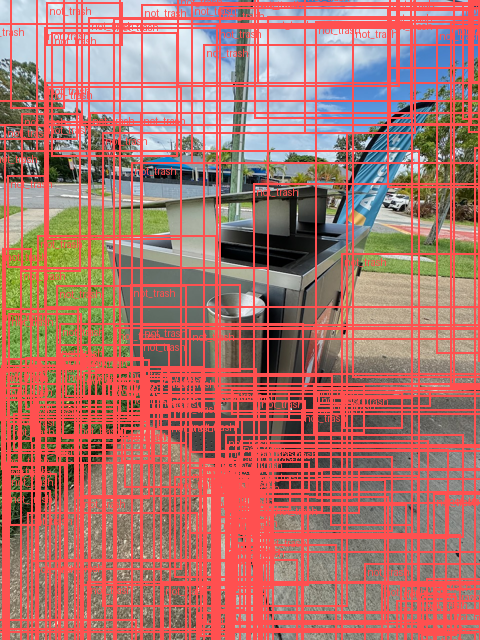

In [ ]:
torchvision.transforms.functional.to_pil_image(
    pic = torchvision.utils.draw_bounding_boxes(
        image = torchvision.transforms.functional.pil_to_tensor(half_image(random_sample["image"])),
        boxes = random_sample_outputs_post_processed[0]['boxes'],
        colors = random_sample_color_pal,
        width=2,
        label_colors  = random_sample_color_pal,
        labels = random_sample_labels
    )
)

## very poor but the model is not finetuned according to our data so good like for single image whole process had made
##

## now our flow is 👇

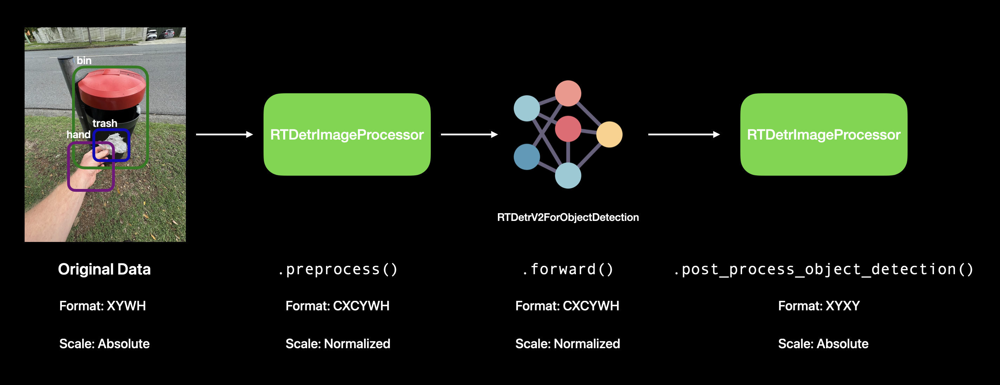

## Preparing data at scale

In [21]:
# we want our dataset in train , test , val format
# current condition : dataset in just train
split_dataset = dataset["train"].train_test_split(test_size=0.2,seed=42)
split_dataset
train = split_dataset["train"]
test = split_dataset["test"]
train , test

(Dataset({
     features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
     num_rows: 902
 }),
 Dataset({
     features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
     num_rows: 226
 }))

In [22]:
test_split = test.train_test_split(test_size = 0.30,seed=42)
test_split

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 158
    })
    test: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 68
    })
})

In [23]:
## final iteration and all split join
dataset["train"] =  train
dataset["test"] = test_split["test"]
dataset["validation"] = test_split["train"]
dataset

DatasetDict({
    train: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 902
    })
    test: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 68
    })
    validation: Dataset({
        features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
        num_rows: 158
    })
})

### Let's check can group of sample pass through the annotations layer or we have to make some new

In [26]:
group_sample = dataset["train"][0:3]

In [ ]:
group_sample

{'image': [<PIL.Image.Image image mode=RGB size=960x1280>,
  <PIL.Image.Image image mode=RGB size=960x1280>,
  <PIL.Image.Image image mode=RGB size=960x1280>],
 'image_id': [899, 534, 653],
 'annotations': [{'file_name': ['37ba6852-55ab-43e7-a6dd-7e0bb70bda5e.jpeg',
    '37ba6852-55ab-43e7-a6dd-7e0bb70bda5e.jpeg',
    '37ba6852-55ab-43e7-a6dd-7e0bb70bda5e.jpeg'],
   'image_id': [899, 899, 899],
   'category_id': [0, 0, 0],
   'bbox': [[305.5, 405.70001220703125, 301.8999938964844, 421.5],
    [545.2000122070312, 387.5, 270.0, 379.1000061035156],
    [712.0999755859375,
     369.29998779296875,
     237.89999389648438,
     324.6000061035156]],
   'iscrowd': [0, 0, 0],
   'area': [127250.8515625, 102357.0, 77222.34375]},
  {'file_name': ['0cf37115-be41-4ec4-b7ee-c9f5c782f55d.jpeg'],
   'image_id': [534],
   'category_id': [0],
   'bbox': [[245.39999389648438,
     377.29998779296875,
     478.3999938964844,
     476.79998779296875]],
   'iscrowd': [0],
   'area': [228101.125]},
  {'file

In [ ]:
# ## now to thing to note is like the format while taking the group of sample is completly different what for one sample it

# ## format for group sample
# {'image': [<PIL.Image.Image image mode=RGB size=960x1280>,
#   <PIL.Image.Image image mode=RGB size=960x1280>,
#   <PIL.Image.Image image mode=RGB size=960x1280>],
#  'image_id': [42, 902, 800],
#  'annotations': [{'file_name': ['63773cb2-e4ac-4b83-b11a-1fd98dc8d445.jpeg',
#     '63773cb2-e4ac-4b83-b11a-1fd98dc8d445.jpeg'],
#    'image_id': [42, 42],
#    'category_id': [0, 0],
#    'bbox': [[223.89999389648438,
#      313.6000061035156,
#      525.4000244140625,
#      712.9000244140625],
#     [30.100000381469727,
#      272.70001220703125,
#      357.29998779296875,
#      487.3999938964844]],
#    'iscrowd': [0, 0],
#    'area': [374557.65625, 174148.015625]},
#   {'file_name': ['4654346c-363c-4e08-a5f1-72fff095c828.jpeg',
#     '4654346c-363c-4e08-a5f1-72fff095c828.jpeg',
#     '4654346c-363c-4e08-a5f1-72fff095c828.jpeg',
#     '4654346c-363c-4e08-a5f1-72fff095c828.jpeg'],
#    'image_id': [902, 902, 902, 902],
#    'category_id': [5, 1, 0, 4],
#    'bbox': [[481.5, 584.5999755859375, 42.5, 63.70000076293945],
#     [496.70001220703125, 398.0, 256.29998779296875, 217.0],
#     [14.699999809265137, 186.10000610351562, 585.0, 776.0],
#     [501.3999938964844, 175.0, 187.6999969482422, 92.80000305175781]],
#    'iscrowd': [0, 0, 0, 0],
#    'area': [2707.25, 55617.1015625, 453960.0, 17418.560546875]},
#   {'file_name': ['1862667e-3d50-4489-9777-d1c30d4bfef3.jpeg',
#     '1862667e-3d50-4489-9777-d1c30d4bfef3.jpeg',
#     '1862667e-3d50-4489-9777-d1c30d4bfef3.jpeg',
#     '1862667e-3d50-4489-9777-d1c30d4bfef3.jpeg',
#     '1862667e-3d50-4489-9777-d1c30d4bfef3.jpeg'],
#    'image_id': [800, 800, 800, 800, 800],
#    'category_id': [5, 6, 1, 0, 0],
#    'bbox': [[504.29998779296875,
#      458.79998779296875,
#      36.400001525878906,
#      18.200000762939453],
#     [534.5999755859375,
#      452.70001220703125,
#      332.1000061035156,
#      398.8999938964844],
#     [689.2999877929688,
#      718.2000122070312,
#      147.10000610351562,
#      172.6999969482422],
#     [375.5, 493.70001220703125, 212.10000610351562, 260.79998779296875],
#     [809.7000122070312,
#      310.1000061035156,
#      146.10000610351562,
#      160.8000030517578]],
#    'iscrowd': [0, 0, 0, 0, 0],
#    'area': [662.47998046875,
#     132474.6875,
#     25404.169921875,
#     55315.6796875,
#     23492.880859375]}],
#  'label_source': ['manual_prodigy_label',
#   'manual_prodigy_label',
#   'manual_prodigy_label'],
#  'image_source': ['manual_taken_photo',
#   'manual_taken_photo',
#   'manual_taken_photo']}

## our single annotation class takes
## image_id , bbox , areas , is_crowd(default),category_id
## Our image annotations class takes
## image_id , single_annotations

### ! so it means that we have to make a new function that will take the data according to this format and make for coco format
## here not many changes we have to make like the "image processor" just required the annotations , image id to process and single image
## so we gona make the thing like from all the passed examples thak one by one all process it and add in list

In [87]:
from torchvision import models, datasets, tv_tensors
from torchvision.transforms import v2
transforms_final = v2.Compose(
    [
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=0.1), # Changed to 0.5 for realistic training randomness
    ]
)

In [ ]:
def preprocess_batch(examples,image_processor,transforms=None):
  """ this function takes examples of image as batch convert the coco annotations and then preprocess
  it with image processor and here if transformations (augmentations) are required that also can add
  and give the final processed batch"""
  images = []
  coco_annotations = []
  for image,image_id,annotations in zip(examples["image"],examples["image_id"],examples["annotations"]):
    # print("In loop")
    area = annotations["area"]
    category_id = annotations["category_id"]
    bbox = annotations["bbox"]
    if transforms:
      # print("in transform loop")
      h,w = image.size
      tv_img = tv_tensors.Image(image)
      tv_boxes = tv_tensors.BoundingBoxes(
          bbox,
          format = "XYWH",
          canvas_size=(h, w)
      )
      tv_labels = torch.tensor(category_id,dtype=torch.int64)
      # print("before transforms")
      tv_img, tv_boxes, tv_labels = transforms(tv_img, tv_boxes, tv_labels) # sugmentation pipeline
      # print("transform done ")
      # unpacking item back
      image = tv_img
      bbox = tv_boxes.tolist()
      category_id = tv_labels.tolist()
      area = [float(b * b) for b in bbox[0]]
    # print("out form transform")
    annotated_image = format_annotaions(image_id,category_id,area,bbox)
    images.append(image)
    coco_annotations.append(annotated_image)
  processed_batch = image_processor.preprocess(images=images,annotations=coco_annotations,return_tensors="pt")
  # print("processing done")
  return processed_batch

In [88]:
preprocessed_samples = preprocess_batch(examples=group_sample,
                                        image_processor=image_processor,transforms=transforms_final)

preprocessed_samples.keys()

KeysView({'pixel_mask': tensor([[[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]],

        [[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]]), 'pixel_values': tensor([[[[0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2510, 0.2549],
          [0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2549, 0.2549],
          [0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2510, 0.2510],
          ...,
          [0.0510, 0.0471, 0.0510,  ..., 0.2078, 0.2235, 0.2275],
  

In [89]:
# Check the shape of our preprocessed samples
print(f"[INFO] Shape of preprocessed samples: {preprocessed_samples['pixel_values'].shape} -> [batch_size, colour_channels, height, width]")

[INFO] Shape of preprocessed samples: torch.Size([3, 3, 640, 480]) -> [batch_size, colour_channels, height, width]


### Let's process this function on whole split

In [90]:
from functools import partial # this is use to convert whole the function in to one argument

preprocess_batch_partial  = partial(preprocess_batch,image_processor=image_processor,transforms=transforms_final)
preprocess_batch_partial

functools.partial(<function preprocess_batch at 0x7f934dd9eb60>, image_processor=RTDetrImageProcessorFast {
  "data_format": "channels_first",
  "do_convert_annotations": true,
  "do_normalize": false,
  "do_pad": true,
  "do_rescale": true,
  "do_resize": true,
  "format": "coco_detection",
  "image_mean": [
    0.485,
    0.456,
    0.406
  ],
  "image_processor_type": "RTDetrImageProcessorFast",
  "image_std": [
    0.229,
    0.224,
    0.225
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "return_segmentation_masks": true,
  "size": {
    "longest_edge": 640,
    "shortest_edge": 640
  }
}
, transforms=Compose(
      ToImage()
      RandomHorizontalFlip(p=0.1)
))

In [91]:
# now adding the dataset.Dataset.with_transform() to process the split on fly

# Create a copy of the original dataset
# (we don't need to do this, this is just so we can inspect the original dataset later on)
processed_dataset = dataset.copy()

# Apply the preprocessing function to the datasets (the preprocessing will happen on the fly, e.g. when the dataset is called rather than in-place)
processed_dataset["train"] = dataset["train"].with_transform(transform=preprocess_batch_partial)
processed_dataset["validation"] = dataset["validation"].with_transform(transform=preprocess_batch_partial)
processed_dataset["test"] = dataset["test"].with_transform(transform=preprocess_batch_partial)

In [108]:
processed_dataset["validation"][42]

AttributeError: 'dict' object has no attribute 'transforms'

In [92]:
processed_dataset["train"][42]

{'pixel_mask': tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]),
 'pixel_values': tensor([[[0.3412, 0.4353, 0.4353,  ..., 0.3255, 0.3137, 0.3216],
          [0.3725, 0.2118, 0.3373,  ..., 0.4314, 0.3176, 0.2078],
          [0.3059, 0.2000, 0.3255,  ..., 0.4627, 0.2118, 0.1529],
          ...,
          [0.4078, 0.4627, 0.3882,  ..., 0.7216, 0.7255, 0.7216],
          [0.4078, 0.4039, 0.3608,  ..., 0.7176, 0.7216, 0.7255],
          [0.3451, 0.3686, 0.3569,  ..., 0.7137, 0.7176, 0.7216]],
 
         [[0.3804, 0.4667, 0.4627,  ..., 0.3451, 0.3176, 0.3216],
          [0.3961, 0.2314, 0.3569,  ..., 0.4392, 0.3176, 0.1961],
          [0.3216, 0.2196, 0.3490,  ..., 0.4627, 0.2078, 0.1451],
          ...,
          [0.3804, 0.4353, 0.3608,  ..., 0.5647, 0.5686, 0.5647],
          [0.3765, 0.3725, 0.3294,  ..., 0.5608, 0.

In [ ]:
# Now when we call one or more of our samples, the preprocessing will take place
batch_size_to_get = 32
print(f"[INFO] Shape of preprocessed images: {processed_dataset['train'][:batch_size_to_get]['pixel_values'].shape} -> [batch_size, colour_channels, height, width]")

[INFO] Shape of preprocessed images: torch.Size([32, 3, 640, 480]) -> [batch_size, colour_channels, height, width]


In [ ]:
# # We can pass these straight to our model! (note: may take a while if it's on CPU)
# response = model(processed_dataset["train"][:batch_size_to_get]["pixel_values"]) # uncomment to view output
# response
## dont try this util have efficient RAM

### Doing collation on the dataset

In [ ]:
## so collation is used that tell the model how to stack this dict_keys(['pixel_values', 'labels', 'pixel_mask']) keys which
# are given from the image_processor.preprocess() and then telling the model to work on it

In [ ]:
test_stack = torch.stack([sample["pixel_values"] for sample in processed_dataset['train'].select(range(32))])
test_stack

tensor([[[[0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2510, 0.2549],
          [0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2549, 0.2549],
          [0.1608, 0.1608, 0.1608,  ..., 0.2510, 0.2510, 0.2510],
          ...,
          [0.0510, 0.0471, 0.0510,  ..., 0.2078, 0.2235, 0.2275],
          [0.0549, 0.0549, 0.0588,  ..., 0.2118, 0.2157, 0.2275],
          [0.0471, 0.0549, 0.0549,  ..., 0.2118, 0.2118, 0.2157]],

         [[0.1176, 0.1176, 0.1176,  ..., 0.2118, 0.2118, 0.2157],
          [0.1176, 0.1176, 0.1176,  ..., 0.2118, 0.2157, 0.2157],
          [0.1176, 0.1176, 0.1176,  ..., 0.2118, 0.2118, 0.2118],
          ...,
          [0.0471, 0.0431, 0.0471,  ..., 0.2118, 0.2235, 0.2275],
          [0.0510, 0.0510, 0.0549,  ..., 0.2118, 0.2157, 0.2275],
          [0.0431, 0.0510, 0.0510,  ..., 0.2118, 0.2118, 0.2157]],

         [[0.1020, 0.1020, 0.1020,  ..., 0.1765, 0.1765, 0.1804],
          [0.1020, 0.1020, 0.1020,  ..., 0.1765, 0.1804, 0.1804],
          [0.1020, 0.1020, 0.1020,  ..., 0

In [ ]:
test_stack.shape

torch.Size([32, 3, 640, 480])

In [93]:
from typing import List,Dict,Any
def data_collate_function(processed_batch:List[Dict[str,Any]]) -> Dict[str, Any]:
  collated_data = {}
  collated_data["pixel_values"] = torch.stack([sample["pixel_values"] for sample in processed_batch])
  collated_data["labels"] = [sample["labels"] for sample in processed_batch] # because labels are dict no need
  if "pixel_mask" in processed_batch[0]:
    collated_data["pixel_mask"] = torch.stack([sample["pixel_mask"] for sample in processed_batch])
  return collated_data

In [94]:
%%time

# Try data_collate_function
example_collated_data_batch = data_collate_function(processed_dataset["train"].select(range(32)))
example_collated_data_batch.keys()

CPU times: user 2.8 s, sys: 237 ms, total: 3.03 s
Wall time: 3.41 s


dict_keys(['pixel_values', 'labels', 'pixel_mask'])

In [73]:
# Check shapes of batched preprocessed samples
print(f"[INFO] Batch of pixel value shapes: {example_collated_data_batch['pixel_values'].shape}")
print(f"[INFO] Batch of labels: {example_collated_data_batch['labels']}")
if "pixel_mask" in example_collated_data_batch:
    print(f"[INFO] Batch of pixel masks: {example_collated_data_batch['pixel_mask'].shape}")

[INFO] Batch of pixel value shapes: torch.Size([32, 3, 640, 480])
[INFO] Batch of labels: [{'size': tensor([640, 480]), 'image_id': tensor([899]), 'class_labels': tensor([0, 0, 0]), 'boxes': tensor([[0.4755, 0.4816, 0.3145, 0.3293],
        [0.7085, 0.4508, 0.2812, 0.2962],
        [0.8657, 0.4153, 0.2478, 0.2536]]), 'area': tensor([23332.5625, 41148.1250, 22785.9023]), 'iscrowd': tensor([0, 0, 0]), 'orig_size': tensor([1280,  960])}, {'size': tensor([640, 480]), 'image_id': tensor([534]), 'class_labels': tensor([0]), 'boxes': tensor([[0.7897, 0.4810, 0.4206, 0.3725]]), 'area': tensor([77339.6172]), 'iscrowd': tensor([0]), 'orig_size': tensor([1280,  960])}, {'size': tensor([640, 480]), 'image_id': tensor([653]), 'class_labels': tensor([5, 1, 4, 0]), 'boxes': tensor([[0.4296, 0.5515, 0.0742, 0.0509],
        [0.2206, 0.7484, 0.4186, 0.4334],
        [0.4990, 0.8205, 0.4747, 0.1680],
        [0.5006, 0.6036, 0.9669, 0.6941]]), 'area': tensor([ 35494.5586, 113366.8984,   1267.3599,   105

##  Setting up TrainingArguments and a Trainer instance to train our model

In [95]:
## creating and model directory
from pathlib import Path
model_dir = Path("models")
model_dir.mkdir(parents=True, exist_ok=True)

In [96]:
# 3. Create an instance of TrainingArguments to pass to Trainer
from transformers import TrainingArguments
BATCH_SIZE = 2
DATALOADER_NUM_WORKERS = 2 # note: if you're on Google Colab, you may have to lower this to os.cpu_count() or to 0

# Set number of epochs to how many laps you'd like to do over the data
NUM_EPOCHS = 10

# Setup hyperameters for training from the DETR paper(s)
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4
MAX_GRAD_NORM = 0.1
WARMUP_RATIO = 0.05 # learning rate warmup from 0 to learning_rate as a ratio of total steps (e.g. 0.05 = 5% of total steps)

# Create directory to save models to
OUTPUT_DIR = Path(model_dir, "rt_detrv2_finetuned_trashify_box_detector_v1")
print(f"[INFO] Saving model to: {OUTPUT_DIR}")

# Create TrainingArguments to pass to Trainer
training_args = TrainingArguments(
    output_dir=OUTPUT_DIR,
    per_device_train_batch_size=BATCH_SIZE,
    per_device_eval_batch_size=BATCH_SIZE,
    learning_rate=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY,
    max_grad_norm=MAX_GRAD_NORM,
    num_train_epochs=NUM_EPOCHS,
    lr_scheduler_type="linear",
    warmup_ratio=WARMUP_RATIO,
    # warmup_steps=2000, # number of warmup steps from 0 to learning_rate (overrides warmup_ratio, found this to be too long for our dataset)
    logging_strategy="epoch",
    save_strategy="epoch",
    save_total_limit=2,
    remove_unused_columns=False,
    fp16=True, # use mixed precision training
    dataloader_num_workers=DATALOADER_NUM_WORKERS, # note: if you're on Google Colab, you may have to lower this to os.cpu_count() or to 0
    eval_strategy="epoch",
    load_best_model_at_end=True,
    metric_for_best_model="eval_loss",
    greater_is_better=False, # want to minimize eval_loss (e.g. lower is better)
    report_to="none", # don't save experiments to a third party service
    push_to_hub=False,
    eval_do_concat_batches=False, # this defaults to True but we'll set it to False for our evaluation function
    # save_safetensors=False # turn this off to prevent potential checkpoint issues
)

warmup_ratio is deprecated and will be removed in v5.2. Use `warmup_steps` instead.


[INFO] Saving model to: models/rt_detrv2_finetuned_trashify_box_detector_v1


###  Optional: Setting up an optimizer for multiple learning rates
### this is just to use the quantity similar to original papers

In [ ]:
model

RTDetrV2ForObjectDetection(
  (model): RTDetrV2Model(
    (backbone): RTDetrV2ConvEncoder(
      (model): RTDetrResNetBackbone(
        (embedder): RTDetrResNetEmbeddings(
          (embedder): Sequential(
            (0): RTDetrResNetConvLayer(
              (convolution): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
            (1): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
            (2): RTDetrResNetConvLayer(
              (convolution): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (normalization): RTDetrV2FrozenBatchNorm2d()
              (activation): ReLU()
            )
          )
          (pooler)

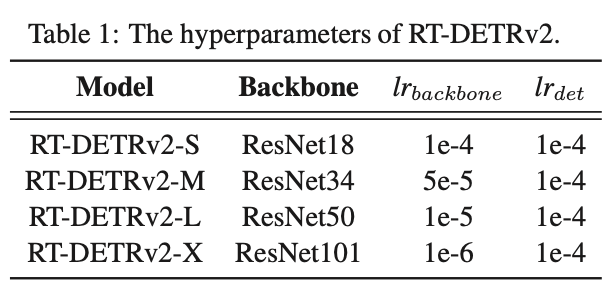

In [76]:
from transformers import Trainer
backbone_parameters = []
other_parameters  = []
for name,param in model.model.named_parameters():
  if "backbone" in name:
    print("[INFO] backbone parameter name:",name)
    backbone_parameters.append(param)
  else:
    print("[INFO] Other parameters name:",name)
    other_parameters.append(param)
print(f"[INFO] Number of backbone parameter modules: {len(backbone_parameters)}")
print(f"[INFO] Number of other parameter modules: {len(other_parameters)}")


[INFO] backbone parameter name: backbone.model.embedder.embedder.0.convolution.weight
[INFO] backbone parameter name: backbone.model.embedder.embedder.1.convolution.weight
[INFO] backbone parameter name: backbone.model.embedder.embedder.2.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.0.shortcut.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.0.layer.0.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.0.layer.1.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.0.layer.2.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.1.layer.0.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.1.layer.1.convolution.weight
[INFO] backbone parameter name: backbone.model.encoder.stages.0.layers.1.layer.2.convolution.weight
[INFO] backbone parameter name: backbone.

In [77]:
BACKBONE_LEARNING_RATE = 1e-5
DETECTION_HEAD_LEARNING_RATE = 1e-4

In [97]:
# Setup a custom subclass of Trainer to use different learning rates for different parts of the model
class CustomerTrainer(Trainer):
  def create_optimizer(self):
    self.optimizer = torch.optim.AdamW([
        {
            "params":backbone_parameters,"lr":BACKBONE_LEARNING_RATE,
            "params":other_parameters,"lr":DETECTION_HEAD_LEARNING_RATE
        }],
        weight_decay=0.0001)
    return self.optimizer

## Creating an evaluation function

In [98]:
import numpy as np
from typing import List,Dict,Any,Optional,Mapping
from transformers import EvalPrediction
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.ops import box_convert

In [99]:
# class model to store the data
@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor

In [109]:
from torchvision.ops import box_convert

def convert_bbox_cxcywh_to_xyxy_absolute(boxes,
                                         image_size_target):
    """
    Converts CXCYWH normalized boxes to XYXY absolute boxes.

    The output of our preprocess method puts boxes in CXCYWH format.

    But our evaluation metric torchmetrics.detection.mean_ap.MeanAveragePrecision expects
        boxes in XYXY absolute format.

    Args:
        boxes (torch.Tensor): A tensor of shape (N, 4) where N is the number of boxes and each box is in CXCYWH format.
        image_size_target (tuple): A tuple containing the target image size as (height, width).

    Returns:
        torch.Tensor: A tensor of shape (N, 4) where each box is converted to XYXY absolute format.
    """
    # Convert normalized CXCYWH (output of model) -> absolute XYXY format (required for evaluation)
    boxes = box_convert(boxes=boxes, in_fmt="cxcywh", out_fmt="xyxy")
    print(boxes)
    # Convert normalized box coordinates to absolute pixel values based on the target size
    image_size_target_height = image_size_target[0]
    image_size_target_width = image_size_target[1]
    boxes = boxes * torch.tensor([image_size_target_width,
                                  image_size_target_height,
                                  image_size_target_width,
                                  image_size_target_height]) # Multiply X coordinates by the width and Y coordinates by the height

    return boxes

In [110]:
# creating the compute metrics function
@torch.no_grad()
def compute_metrics(
  evaluation_results: EvalPrediction, # these come out of the Trainer.evaluate method, see: https://huggingface.co/docs/transformers/en/internal/trainer_utils#transformers.EvalPrediction
  image_processor: AutoImageProcessor,
  threshold: float = 0.0,
  id2label: Optional[Mapping[int, str]] = None,
) -> Mapping[str,float]:
  # compute the predictions and labels form evalprediction
  predictions , targets = evaluation_results.predictions,evaluation_results.label_ids
  pprint(predictions)
  print("============")
  pprint(targets)
    # For metric computation we need to provide to MeanAveragePrecision
    #  - 'targets' in a form of list of dictionaries with keys "boxes", "labels"
    #  - 'predictions' in a form of list of dictionaries with keys "boxes", "scores", "labels"
  # 4. Get a list of image sizes, processed targets and processed predictions
  image_sizes = []
  post_processed_targets = []
  post_processed_predictions = []
  ## true labels : ground truth
  for batch in targets:
    batch_image_sizes = torch.tensor(np.array([x["orig_size"] for x in batch])) # turn into a list of numpy arrays first, then tensors
    image_sizes.append(batch_image_sizes)
    for image_target in batch:
      boxes = torch.tensor(image_target["boxes"])
      boxes = convert_bbox_cxcywh_to_xyxy_absolute(boxes=boxes,
                                                         image_size_target=image_target["orig_size"])
      labels = torch.tensor(image_target["class_labels"])
      post_processed_targets.append({"boxes":boxes,"labels":labels})

  ## model predictions
  for pred_batch,target_sizes in zip(predictions,image_sizes):
    # pred_batch comes in the form of a tuple: (loss, logits, boxes)
    pred_batch_loss, pred_batch_logits, pred_batch_boxes = pred_batch[0], pred_batch[1], pred_batch[2]
    model_output = ModelOutput(logits=torch.tensor(pred_batch_logits),pred_boxes=torch.tensor(pred_batch_boxes))
    post_processed_output = image_processor.post_process_object_detection(
        outputs = model_output,
        threshold=threshold,
        target_sizes = target_sizes
    )
    # Extend post_processed_output in form `[{"boxes": [...], "labels": [...], "scores": [...]}]`
     # We extend because post_process_object_detection returns a list of dictionaries, so rather than append a list to a list we extend the existing list
    post_processed_predictions.extend(post_processed_output)
  # 7. Compute mAP
  max_detection_thresholds = [1, 10, 100] # 1 = mar@1, mar@10, mar@100 (100 = default max total boxes for post processed predictions out of object detection model)
  metric = MeanAveragePrecision(box_format="xyxy",
                                  class_metrics=True,
                                  max_detection_thresholds=max_detection_thresholds)
  metric.warn_on_many_detections = False # don't output a warning when large amount of detections come out (the sorting handles this anyway)
  metric.update(post_processed_predictions,
                  post_processed_targets)
  metrics = metric.compute()
  ## takeing per class metrics
  classes = metrics.pop("classes")
  map_per_class = metrics.pop("map_per_class")
  mar_per_class = metrics.pop("mar_100_per_class")
   # 9. Prepare metrics per class in the form of a dict with metric names -> values, e.g. {"metric_name": 42.0, ...}
    # for class_id, class_map in zip(classes, map_per_class):
  for class_id, class_map, class_mar in zip(classes, map_per_class, mar_per_class):
      class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
      metrics[f"map_{class_name}"] = class_map

        # Optional: mAR@100 per class
      metrics[f"mar_100_{class_name}"] = class_mar

    # 10. Round metrics for suitable visual output
  metrics = {k: round(v.item(), 4) for k, v in metrics.items()}
  return metrics

In [111]:
eval_compute_metrics_fn = partial(
        compute_metrics,
        image_processor=image_processor,
        threshold=0.0,
        id2label=id2label,
)

## Training our model with Trainer

In [112]:
# Note: Depending on the size/speed of your GPU, this may take a while
from transformers import Trainer

# 5. Setup instance of Trainer
model_v1_trainer = Trainer(
    model=model,
    args=training_args,
    data_collator=data_collate_function,
    train_dataset=processed_dataset["train"], # pass in the already preprocessed data
    eval_dataset=processed_dataset["validation"],
    compute_metrics=eval_compute_metrics_fn,
)

# 6. Train the model
model_v1_results = model_v1_trainer.train(
    # resume_from_checkpoint=False # you can continue training a model here by passing in the path to a previous checkpoint
)

ValueError: boxes1 must be in [x0, y0, x1, y1] (corner) format, but got tensor([[nan, nan, nan, nan],
        [nan, nan, nan, nan],
        [nan, nan, nan, nan],
        ...,
        [nan, nan, nan, nan],
        [nan, nan, nan, nan],
        [nan, nan, nan, nan]], device='cuda:0')

In [86]:
processed_dataset["validation"][43]

{'pixel_mask': tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]),
 'pixel_values': tensor([[[0.1216, 0.1412, 0.1255,  ..., 0.2431, 0.2784, 0.2118],
          [0.1686, 0.1333, 0.1176,  ..., 0.2902, 0.2902, 0.1882],
          [0.1294, 0.1216, 0.1176,  ..., 0.3294, 0.2588, 0.2039],
          ...,
          [0.8745, 0.8863, 0.8510,  ..., 0.2471, 0.2314, 0.2196],
          [0.8980, 0.8431, 0.8078,  ..., 0.3020, 0.3216, 0.2784],
          [0.8863, 0.7255, 0.6784,  ..., 0.3490, 0.3529, 0.3373]],
 
         [[0.1647, 0.1804, 0.1686,  ..., 0.2431, 0.2784, 0.2039],
          [0.2078, 0.1725, 0.1569,  ..., 0.2902, 0.2824, 0.1804],
          [0.1686, 0.1608, 0.1569,  ..., 0.3255, 0.2510, 0.1961],
          ...,
          [0.9294, 0.9216, 0.8667,  ..., 0.2196, 0.2000, 0.1882],
          [0.8980, 0.8157, 0.7529,  ..., 0.2784, 0.

### Visualizing the model performance

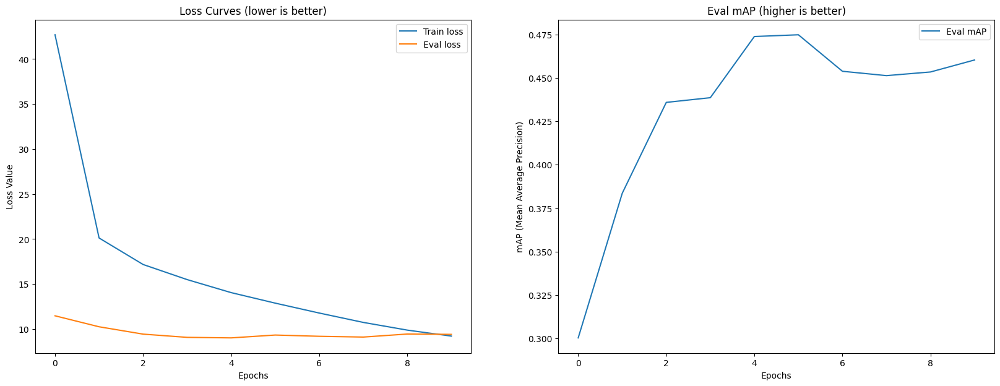

In [ ]:
# 7. Plotting our model's loss curves
import matplotlib.pyplot as plt

log_history = model_v1_trainer.state.log_history

# Exctract loss values
train_loss = [item["loss"] for item in log_history if "loss" in item]
eval_loss = [item["eval_loss"] for item in log_history if "eval_loss" in item]

# Extract mAP values
eval_map = [item["eval_map"] for item in log_history if "eval_map" in item]

# Plot loss curves and mAP
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 7))
ax[0].plot(train_loss, label="Train loss")
ax[0].plot(eval_loss, label="Eval loss")
ax[0].set_title("Loss Curves (lower is better)")
ax[0].set_ylabel("Loss Value")
ax[0].set_xlabel("Epochs")
ax[0].legend()

ax[1].plot(eval_map, label="Eval mAP")
ax[1].set_title("Eval mAP (higher is better)")
ax[1].set_ylabel("mAP (Mean Average Precision)")
ax[1].set_xlabel("Epochs")
ax[1].legend();

## Predicting on test dataset

In [ ]:
# Our dataset is broken into "train", "validation", "test"
processed_dataset

{'train': Dataset({
     features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
     num_rows: 902
 }),
 'test': Dataset({
     features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
     num_rows: 68
 }),
 'validation': Dataset({
     features: ['image', 'image_id', 'annotations', 'label_source', 'image_source'],
     num_rows: 158
 })}

In [ ]:
# Inspect a single sample of the processed test dataset
processed_dataset["test"][0]

{'pixel_mask': tensor([[1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         ...,
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1],
         [1, 1, 1,  ..., 1, 1, 1]]),
 'pixel_values': tensor([[[0.0627, 0.0235, 0.0196,  ..., 0.4353, 0.4275, 0.4588],
          [0.0667, 0.0235, 0.0235,  ..., 0.3529, 0.3451, 0.3725],
          [0.0471, 0.0196, 0.0157,  ..., 0.2706, 0.2314, 0.2431],
          ...,
          [0.2667, 0.2667, 0.4706,  ..., 0.2588, 0.2549, 0.2549],
          [0.1137, 0.1765, 0.4118,  ..., 0.2588, 0.2588, 0.2588],
          [0.0784, 0.1333, 0.5569,  ..., 0.2588, 0.2588, 0.2588]],
 
         [[0.0824, 0.0431, 0.0353,  ..., 0.6078, 0.5686, 0.5765],
          [0.0824, 0.0392, 0.0431,  ..., 0.4510, 0.4196, 0.4314],
          [0.0667, 0.0353, 0.0353,  ..., 0.3059, 0.2627, 0.2784],
          ...,
          [0.2941, 0.2863, 0.4863,  ..., 0.2000, 0.1961, 0.1961],
          [0.1373, 0.1961, 0.4353,  ..., 0.2000, 0.

In [ ]:
# Make predictions with trainer containing trained model
test_dataset_preds = model_v1_trainer.predict(test_dataset=processed_dataset["test"])
# test_dataset_preds

In [ ]:
test_dataset_preds

PredictionOutput(predictions=[({'loss_vfl': array(0.5306929, dtype=float32), 'loss_bbox': array(0.2020648, dtype=float32), 'loss_giou': array(0.27199936, dtype=float32), 'loss_vfl_aux_0': array(0.65586364, dtype=float32), 'loss_bbox_aux_0': array(0.19059268, dtype=float32), 'loss_giou_aux_0': array(0.27419707, dtype=float32), 'loss_vfl_aux_1': array(0.5269591, dtype=float32), 'loss_bbox_aux_1': array(0.19995101, dtype=float32), 'loss_giou_aux_1': array(0.27386287, dtype=float32), 'loss_vfl_aux_2': array(0.50636446, dtype=float32), 'loss_bbox_aux_2': array(0.20163801, dtype=float32), 'loss_giou_aux_2': array(0.2729613, dtype=float32), 'loss_vfl_aux_3': array(0.48186597, dtype=float32), 'loss_bbox_aux_3': array(0.19754721, dtype=float32), 'loss_giou_aux_3': array(0.2713964, dtype=float32), 'loss_vfl_aux_4': array(0.52262366, dtype=float32), 'loss_bbox_aux_4': array(0.20204562, dtype=float32), 'loss_giou_aux_4': array(0.27265918, dtype=float32), 'loss_vfl_aux_5': array(0.854777, dtype=flo

In [ ]:
# Predictions come in the same batch size as our training setup
test_dataset_prediction_outputs = test_dataset_preds.predictions
test_dataset_label_outputs = test_dataset_preds.label_ids

print(f"[INFO] Found {len(test_dataset_prediction_outputs)} batches of prediction samples and {len(test_dataset_label_outputs)} batches of labels.")

[INFO] Found 34 batches of prediction samples and 34 batches of labels.


In [ ]:
test_dataset_prediction_outputs

[({'loss_vfl': array(0.5306929, dtype=float32),
   'loss_bbox': array(0.2020648, dtype=float32),
   'loss_giou': array(0.27199936, dtype=float32),
   'loss_vfl_aux_0': array(0.65586364, dtype=float32),
   'loss_bbox_aux_0': array(0.19059268, dtype=float32),
   'loss_giou_aux_0': array(0.27419707, dtype=float32),
   'loss_vfl_aux_1': array(0.5269591, dtype=float32),
   'loss_bbox_aux_1': array(0.19995101, dtype=float32),
   'loss_giou_aux_1': array(0.27386287, dtype=float32),
   'loss_vfl_aux_2': array(0.50636446, dtype=float32),
   'loss_bbox_aux_2': array(0.20163801, dtype=float32),
   'loss_giou_aux_2': array(0.2729613, dtype=float32),
   'loss_vfl_aux_3': array(0.48186597, dtype=float32),
   'loss_bbox_aux_3': array(0.19754721, dtype=float32),
   'loss_giou_aux_3': array(0.2713964, dtype=float32),
   'loss_vfl_aux_4': array(0.52262366, dtype=float32),
   'loss_bbox_aux_4': array(0.20204562, dtype=float32),
   'loss_giou_aux_4': array(0.27265918, dtype=float32),
   'loss_vfl_aux_5': 

In [ ]:
test_dataset_prediction_outputs[0]

({'loss_vfl': array(0.5306929, dtype=float32),
  'loss_bbox': array(0.2020648, dtype=float32),
  'loss_giou': array(0.27199936, dtype=float32),
  'loss_vfl_aux_0': array(0.65586364, dtype=float32),
  'loss_bbox_aux_0': array(0.19059268, dtype=float32),
  'loss_giou_aux_0': array(0.27419707, dtype=float32),
  'loss_vfl_aux_1': array(0.5269591, dtype=float32),
  'loss_bbox_aux_1': array(0.19995101, dtype=float32),
  'loss_giou_aux_1': array(0.27386287, dtype=float32),
  'loss_vfl_aux_2': array(0.50636446, dtype=float32),
  'loss_bbox_aux_2': array(0.20163801, dtype=float32),
  'loss_giou_aux_2': array(0.2729613, dtype=float32),
  'loss_vfl_aux_3': array(0.48186597, dtype=float32),
  'loss_bbox_aux_3': array(0.19754721, dtype=float32),
  'loss_giou_aux_3': array(0.2713964, dtype=float32),
  'loss_vfl_aux_4': array(0.52262366, dtype=float32),
  'loss_bbox_aux_4': array(0.20204562, dtype=float32),
  'loss_giou_aux_4': array(0.27265918, dtype=float32),
  'loss_vfl_aux_5': array(0.854777, dty

In [ ]:
test_dataset_prediction_outputs[0][0]

{'loss_vfl': array(0.5306929, dtype=float32),
 'loss_bbox': array(0.2020648, dtype=float32),
 'loss_giou': array(0.27199936, dtype=float32),
 'loss_vfl_aux_0': array(0.65586364, dtype=float32),
 'loss_bbox_aux_0': array(0.19059268, dtype=float32),
 'loss_giou_aux_0': array(0.27419707, dtype=float32),
 'loss_vfl_aux_1': array(0.5269591, dtype=float32),
 'loss_bbox_aux_1': array(0.19995101, dtype=float32),
 'loss_giou_aux_1': array(0.27386287, dtype=float32),
 'loss_vfl_aux_2': array(0.50636446, dtype=float32),
 'loss_bbox_aux_2': array(0.20163801, dtype=float32),
 'loss_giou_aux_2': array(0.2729613, dtype=float32),
 'loss_vfl_aux_3': array(0.48186597, dtype=float32),
 'loss_bbox_aux_3': array(0.19754721, dtype=float32),
 'loss_giou_aux_3': array(0.2713964, dtype=float32),
 'loss_vfl_aux_4': array(0.52262366, dtype=float32),
 'loss_bbox_aux_4': array(0.20204562, dtype=float32),
 'loss_giou_aux_4': array(0.27265918, dtype=float32),
 'loss_vfl_aux_5': array(0.854777, dtype=float32),
 'loss

In [ ]:
# Get the first batch of test prediction samples
test_batch_metrics = test_dataset_prediction_outputs[0][0] # metrics come at index 0 in the form of a dictionary
test_batch_logits = test_dataset_prediction_outputs[0][1] # logits come at index 1 in a numpy array
test_batch_boxes = test_dataset_prediction_outputs[0][2] # predicted boxes come at index 2 in a numpy array

print(f"[INFO] Metrics keys: {test_batch_metrics.keys()}")
print(f"[INFO] Test predictions single batch logits shape: {test_batch_logits.shape} -> (batch_size, num_predictions, logit_per_class)")
print(f"[INFO] Test predictions single batch boxes shape: {test_batch_boxes.shape} -> (batch_size, num_predictions, box_coordinates)")
print(f"[INFO] Test logits type: {type(test_batch_logits)} | Test boxes type: {type(test_batch_boxes)}")

[INFO] Metrics keys: dict_keys(['loss_vfl', 'loss_bbox', 'loss_giou', 'loss_vfl_aux_0', 'loss_bbox_aux_0', 'loss_giou_aux_0', 'loss_vfl_aux_1', 'loss_bbox_aux_1', 'loss_giou_aux_1', 'loss_vfl_aux_2', 'loss_bbox_aux_2', 'loss_giou_aux_2', 'loss_vfl_aux_3', 'loss_bbox_aux_3', 'loss_giou_aux_3', 'loss_vfl_aux_4', 'loss_bbox_aux_4', 'loss_giou_aux_4', 'loss_vfl_aux_5', 'loss_bbox_aux_5', 'loss_giou_aux_5'])
[INFO] Test predictions single batch logits shape: (2, 300, 7) -> (batch_size, num_predictions, logit_per_class)
[INFO] Test predictions single batch boxes shape: (2, 300, 4) -> (batch_size, num_predictions, box_coordinates)
[INFO] Test logits type: <class 'numpy.ndarray'> | Test boxes type: <class 'numpy.ndarray'>


In [ ]:
## so just we have and batch_size = 2 i.e 34 batches and as it is individual to make in single batch conconate to numpy ans then tensor
# We can stack these together to get the full outputs
test_dataset_pred_logits = []
test_dataset_pred_boxes = []

for test_pred_batch in test_dataset_prediction_outputs:
    test_dataset_pred_logits.append(test_pred_batch[1]) # logits come at index 1
    test_dataset_pred_boxes.append(test_pred_batch[2]) # boxes come at index 2

test_dataset_pred_logits = torch.tensor(np.concatenate(test_dataset_pred_logits))
test_dataset_pred_boxes = torch.tensor(np.concatenate(test_dataset_pred_boxes))

print(f"[INFO] Test predictions logits shape: {test_dataset_pred_logits.shape} -> (num_samples, num_predictions, logit_per_class)")
print(f"[INFO] Test predictions boxes shape: {test_dataset_pred_boxes.shape} -> (num_samples, num_predictions, box_coordinates - CXCYWH normalize format)")

[INFO] Test predictions logits shape: torch.Size([68, 300, 7]) -> (num_samples, num_predictions, logit_per_class)
[INFO] Test predictions boxes shape: torch.Size([68, 300, 4]) -> (num_samples, num_predictions, box_coordinates - CXCYWH normalize format)


## Evaluating our test predictions

In [ ]:
test_dataset_pred_boxes.shape # whole test dataset and 300 queries with cxcywh format

torch.Size([68, 300, 4])

In [ ]:
# Create an empty list for preds
test_dataset_prediction_dicts = []

# Set a threshold for prediction probabilities (we'll use 0.0 to allow all possible predictions, change this if you feel like)
THRESHOLD = 0.0

In [ ]:
for i in range(len(test_dataset_pred_boxes)):
  pred_batch_boxes = test_dataset_pred_boxes[i].unsqueeze(0)
  pred_batch_logit = test_dataset_pred_logits[i].unsqueeze(0)

  original_size = processed_dataset["train"][0]["labels"]["orig_size"].unsqueeze(0)
  pred_outputs = ModelOutput(logits=pred_batch_logit,pred_boxes=pred_batch_boxes)
  processed_outputs = image_processor.post_process_object_detection(
      outputs = pred_outputs,
      threshold = THRESHOLD,
      target_sizes = original_size
  )
  prediction_dict = {"boxes": processed_outputs[0]["boxes"],
                       "scores": processed_outputs[0]["scores"],
                       "labels": processed_outputs[0]["labels"]}

  # Append dictionary to list
  test_dataset_prediction_dicts.append(prediction_dict)

print(f"[INFO] Number of prediction dicts: {len(test_dataset_prediction_dicts)}")
print(f"[INFO] Example prediction dict:")
test_dataset_prediction_dicts[0] # for the first images


[INFO] Number of prediction dicts: 68
[INFO] Example prediction dict:


{'boxes': tensor([[189.7087, 356.5911, 652.1916, 842.2352],
         [310.3224, 522.3774, 487.2068, 835.8224],
         [518.6674, 305.6216, 790.7964, 645.4950],
         ...,
         [ 10.9400, 185.4217, 189.7876, 409.2633],
         [834.5201, 367.3066, 973.3361, 480.3313],
         [  5.0256, 151.5740, 136.8932, 233.6120]]),
 'scores': tensor([0.9472, 0.9283, 0.8826, 0.6450, 0.4315, 0.1463, 0.0967, 0.0890, 0.0815,
         0.0806, 0.0715, 0.0661, 0.0582, 0.0563, 0.0559, 0.0521, 0.0519, 0.0515,
         0.0496, 0.0482, 0.0476, 0.0472, 0.0425, 0.0421, 0.0408, 0.0406, 0.0405,
         0.0394, 0.0376, 0.0364, 0.0356, 0.0356, 0.0355, 0.0355, 0.0351, 0.0344,
         0.0335, 0.0324, 0.0317, 0.0314, 0.0313, 0.0307, 0.0306, 0.0302, 0.0300,
         0.0279, 0.0278, 0.0276, 0.0265, 0.0264, 0.0260, 0.0258, 0.0255, 0.0253,
         0.0252, 0.0251, 0.0251, 0.0248, 0.0247, 0.0246, 0.0243, 0.0241, 0.0238,
         0.0233, 0.0230, 0.0229, 0.0229, 0.0225, 0.0225, 0.0225, 0.0219, 0.0219,
         0.

In [ ]:
processed_dataset["train"][0]["labels"]["orig_size"]

tensor([1280,  960])

In [ ]:
## creating target dictonary refering original output for each sample
# Create a list for targets
test_dataset_target_dicts = []

# Iterate through test samples
for test_sample in processed_dataset["test"]:

    # Extract truth labels
    sample_labels = test_sample["labels"]

    # Extract class labels and boxes
    truth_class_labels = sample_labels["class_labels"]
    truth_boxes = sample_labels["boxes"]

    # Get original size of image
    original_size = sample_labels["orig_size"] # size of original image in (height, width)

    # Convert boxes from CXCYWH normalized to XYXY absolute
    truth_boxes_xyxy = convert_bbox_cxcywh_to_xyxy_absolute(boxes=truth_boxes,
                                                            image_size_target=original_size)

    # Create target truth dictionary
    target_dict = {"boxes": truth_boxes_xyxy,
                   "labels": truth_class_labels}

    # Append target dictionary to list
    test_dataset_target_dicts.append(target_dict)

print(f"[INFO] Number of target dictionaries: {len(test_dataset_target_dicts)}")
print(f"[INFO] Example target dictionary:")
test_dataset_target_dicts[0]

[INFO] Number of target dictionaries: 68
[INFO] Example target dictionary:


{'boxes': tensor([[322.3000, 522.4000, 480.0000, 836.5000],
         [424.0000, 684.7000, 624.0001, 903.1000],
         [187.4000, 354.3000, 646.7000, 818.0000],
         [539.7001, 316.2000, 788.9001, 624.1000]]),
 'labels': tensor([5, 1, 0, 0])}

In [ ]:
# Compare predictions to targets
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Instantiate MAP metric instance
map_metric = MeanAveragePrecision(iou_type="bbox",
                                  class_metrics=True) # we want metrics for each individual class
map_metric.warn_on_many_detections = False # hide extra detection warnings

# Update our metric with list of pred dicts and list of target dicts
map_metric.update(preds=test_dataset_prediction_dicts,
                  target=test_dataset_target_dicts)

# Calculate the metric
test_metric_outputs = map_metric.compute()

# Extract per class metrics (we'll use these later on)
test_map_per_class = test_metric_outputs.pop("map_per_class")
test_mar_per_class = test_metric_outputs.pop("mar_100_per_class")

# Inspect the metrics
test_metric_outputs

{'map': tensor(0.4759),
 'map_50': tensor(0.6391),
 'map_75': tensor(0.5467),
 'map_small': tensor(0.),
 'map_medium': tensor(0.3725),
 'map_large': tensor(0.4893),
 'mar_1': tensor(0.5235),
 'mar_10': tensor(0.7080),
 'mar_100': tensor(0.7302),
 'mar_small': tensor(0.),
 'mar_medium': tensor(0.5537),
 'mar_large': tensor(0.7457),
 'classes': tensor([0, 1, 2, 3, 4, 5, 6], dtype=torch.int32)}

In [ ]:
test_map_per_class

tensor([0.7744, 0.6260, 0.3035, 0.0013, 0.2177, 0.6530, 0.7554])

## Visualizing Evaluation metrics

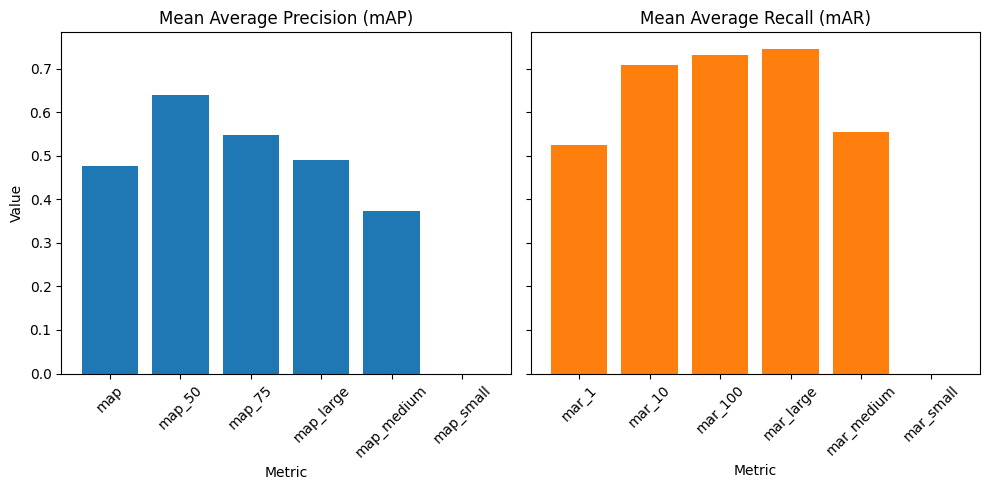

In [ ]:
import matplotlib.pyplot as plt

# Extract mAP and mAR metrics
test_map_metrics = {key: value for key, value in test_metric_outputs.items() if "map" in key}
test_mar_metrics = {key: value for key, value in test_metric_outputs.items() if "mar" in key}

# Get labels and values
test_map_labels, test_map_values = zip(*sorted(test_map_metrics.items()))
test_mar_labels, test_mar_values = zip(*sorted(test_mar_metrics.items()))

# Create a subplot
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), sharey=True)

# Add mAP values
ax[0].bar(test_map_labels, test_map_values)
ax[0].set_title("Mean Average Precision (mAP)")
ax[0].set_xlabel("Metric")
ax[0].set_ylabel("Value")
ax[0].tick_params(axis="x", rotation=45)

# Add mAR values
ax[1].bar(test_mar_labels, test_mar_values, color="tab:orange")
ax[1].set_title("Mean Average Recall (mAR)")
ax[1].set_xlabel("Metric")
ax[1].tick_params(axis="x", rotation=45)

plt.tight_layout()

In [ ]:
dict(zip(list(label2id.keys()), test_map_per_class))

{'bin': tensor(0.7744),
 'hand': tensor(0.6260),
 'not_bin': tensor(0.3035),
 'not_hand': tensor(0.0013),
 'not_trash': tensor(0.2177),
 'trash': tensor(0.6530),
 'trash_arm': tensor(0.7554)}

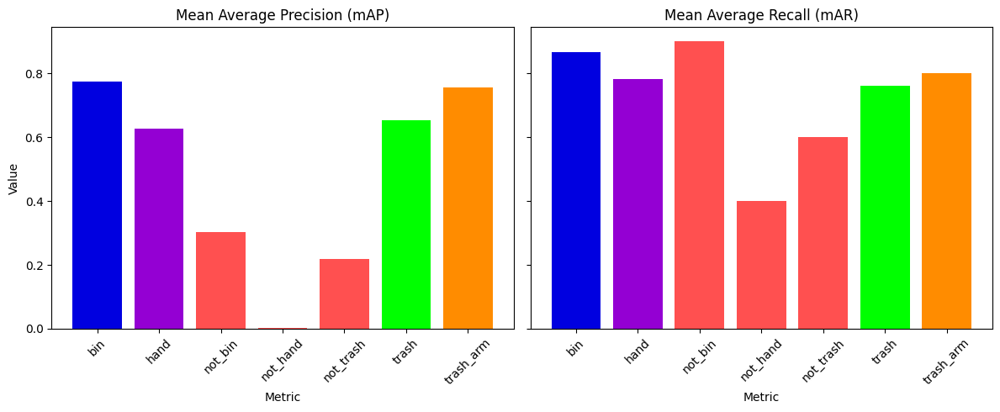

In [ ]:
## visualize per class value

# Map class names to metric values
test_map_per_class_dict = dict(zip(list(label2id.keys()), test_map_per_class))
test_mar_per_class_dict = dict(zip(list(label2id.keys()), test_mar_per_class))

# Get labels and values
test_map_per_class_labels, test_map_per_class_values = zip(*sorted(test_map_per_class_dict.items()))
test_mar_per_class_labels, test_mar_per_class_values = zip(*sorted(test_mar_per_class_dict.items()))

# Create a list of RGB colour floats for matplotlib
label_to_colour_dict = {key: normalize_color_pal(value) for key, value in colour_palette.items()}

colours_for_map = [label_to_colour_dict.get(label_name, (0.6, 0.6, 0.6)) for label_name in test_map_per_class_labels] # (0.6, 0.6, 0.6) = fallback to grey colour
colours_for_mar = [label_to_colour_dict.get(label_name, (0.6, 0.6, 0.6)) for label_name in test_mar_per_class_labels] # (0.6, 0.6, 0.6) = fallback to grey colour

# Create a subplot
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharey=True)

# Add mAP values
ax[0].bar(test_map_per_class_labels,
          test_map_per_class_values,
          color=colours_for_map)
ax[0].set_title("Mean Average Precision (mAP)")
ax[0].set_xlabel("Metric")
ax[0].set_ylabel("Value")
ax[0].tick_params(axis="x", rotation=45)

# Add mAR values
ax[1].bar(test_mar_per_class_labels,
          test_mar_per_class_values,
          color=colours_for_mar)
ax[1].set_title("Mean Average Recall (mAR)")
ax[1].set_xlabel("Metric")
ax[1].tick_params(axis="x", rotation=45)

plt.tight_layout()

## Evaluating and visualizing predictions one by one

[INFO] Making predictions on test item with index: 14
[INFO] Total time to perform prediction: 0.612 seconds.
[INFO] Labels with scores:
Pred: trash (0.9472)
Pred: hand (0.9)
Pred: bin (0.8941)


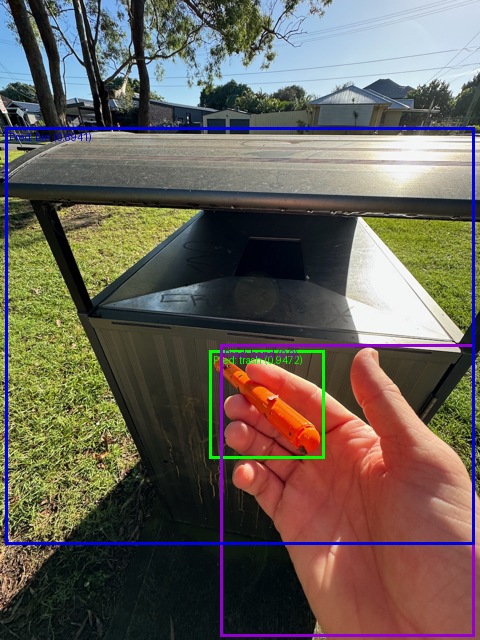

In [ ]:
import time
from torchvision.transforms.functional import to_pil_image, pil_to_tensor
from torchvision.utils import draw_bounding_boxes

# Get a random sample from the test preds
random_test_pred_index = random.randint(0, len(processed_dataset["test"]))
print(f"[INFO] Making predictions on test item with index: {random_test_pred_index}")

# Get a random sample from the processed dataset
random_test_sample = processed_dataset["test"][random_test_pred_index]

# Do a single forward pass with the model (we'll time how long it takes for fun)
start_pred_time = time.time()
random_test_sample_outputs = model(pixel_values=random_test_sample["pixel_values"].unsqueeze(0).to("cuda"), # model expects input [batch_size, color_channels, height, width]
                                   pixel_mask=None)
end_pred_time = time.time()
print(f"[INFO] Total time to perform prediction: {round(end_pred_time - start_pred_time, 3)} seconds.")

# Post process a random item from test preds
random_test_sample_outputs_post_processed = image_processor.post_process_object_detection(
    outputs=random_test_sample_outputs,
    threshold=0.35, # prediction probability threshold for boxes (note: boxes from an untrained model will likely be bad)
    target_sizes=random_test_sample["labels"]["orig_size"].unsqueeze(0) # original input image size (or whichever target size you'd like), required to be same number of input items in a list
)

# Extract scores, labels and boxes
random_test_sample_pred_scores = random_test_sample_outputs_post_processed[0]["scores"]
random_test_sample_pred_labels = random_test_sample_outputs_post_processed[0]["labels"]
random_test_sample_pred_boxes = half_boxes(random_test_sample_outputs_post_processed[0]["boxes"])

# Create a list of labels and colours to plot on the boxes
random_test_sample_pred_to_score_tuples = [(id2label[label_pred.item()], round(score_pred.item(), 4))
                                           for label_pred, score_pred in zip(random_test_sample_pred_labels, random_test_sample_pred_scores)]
random_test_sample_labels_to_plot = [f"Pred: {item[0]} ({item[1]})" for item in random_test_sample_pred_to_score_tuples]
random_test_sample_colours_to_plot = [colour_palette[item[0]] for item in random_test_sample_pred_to_score_tuples]

print(f"[INFO] Labels with scores:")
for label in random_test_sample_labels_to_plot:
    print(label)

# Plot the predicted boxes on the random test image
test_pred_box_image = to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=half_image(dataset["test"][random_test_pred_index]["image"])),
        boxes=random_test_sample_pred_boxes,
        colors=random_test_sample_colours_to_plot,
        labels=random_test_sample_labels_to_plot,
        width=3
    )
)

test_pred_box_image

## Comparing model predictied boxes to ground truth

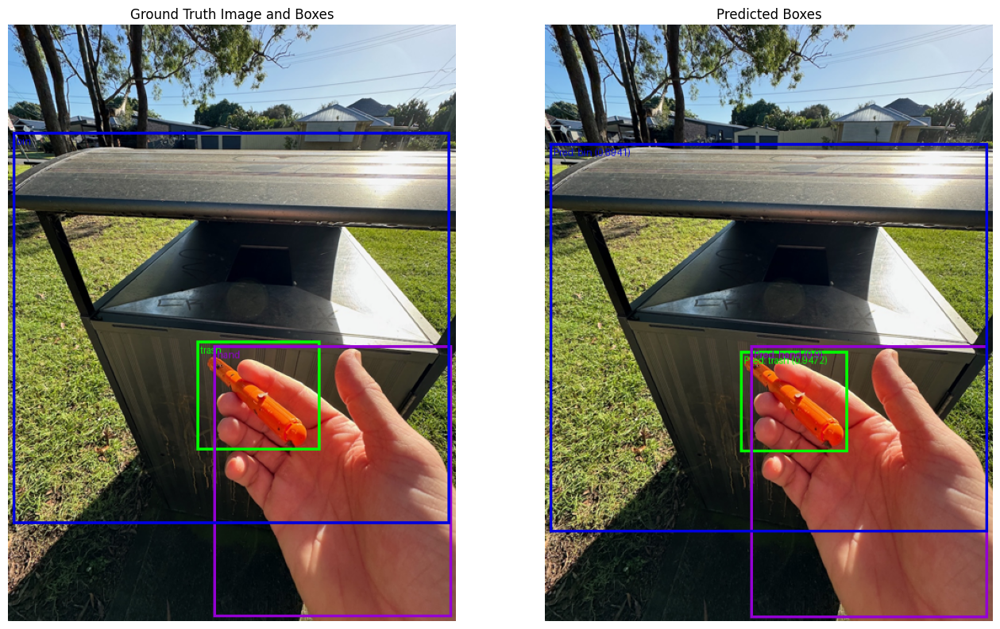

In [ ]:
# Get ground truth image
ground_truth_image = half_image(dataset["test"][random_test_pred_index]["image"])

# Get ground truth boxes (we'll convert these from CXCYWH -> XYXY to be in the same format as our prediction boxes)
ground_truth_boxes = [convert_bbox_cxcywh_to_xyxy_absolute(boxes=input_box,
                                                           image_size_target=random_test_sample["labels"]["orig_size"]) for input_box in random_test_sample["labels"]["boxes"]]
ground_truth_boxes = torch.stack(half_boxes(ground_truth_boxes))

# Get ground truth labels and colours
ground_truth_labels = [id2label[label.item()] for label in random_test_sample["labels"]["class_labels"]]
ground_truth_colours = [colour_palette[label] for label in ground_truth_labels]

# Create ground truth box plot image
test_ground_truth_box_image = to_pil_image(
    pic=draw_bounding_boxes(
        image=pil_to_tensor(pic=ground_truth_image),
        boxes=ground_truth_boxes,
        colors=ground_truth_colours,
        labels=ground_truth_labels,
        width=3
    )
)

# Plot ground truth image and boxes to predicted image and boxes
fig, ax = plt.subplots(ncols=2, figsize=(16, 10))
ax[0].imshow(test_ground_truth_box_image)
ax[0].set_title("Ground Truth Image and Boxes")
ax[0].axis(False)
ax[1].imshow(test_pred_box_image)
ax[1].set_title("Predicted Boxes")
ax[1].axis(False)

plt.show()

## Uploading our trained model to Hugging Face Hub

In [ ]:
# Save the model
from datetime import datetime # optional: add a date of when we trained our model

# Get details to add to model's save path
training_epochs_ = training_args.num_train_epochs
learning_rate_ = "{:.0e}".format(training_args.learning_rate)

# Create model save path with some training details
model_save_path = f"models/learn_hf_rt_detrv2_finetuned_trashify_box_dataset_only_manual_data_no_aug_{training_epochs_}_epochs_lr_{learning_rate_}"

# Save model to file
print(f"[INFO] Saving model to: {model_save_path}")
model_v1_trainer.save_model(model_save_path)

[INFO] Saving model to: models/learn_hf_rt_detrv2_finetuned_trashify_box_dataset_only_manual_data_no_aug_10_epochs_lr_1e-04


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
## adding image processor also
# Make sure trainer has the processor class (this can sometimes be automatically assigned, however, we'll hard code it just to be safe)
model_v1_trainer.processing_class = image_processor

In [ ]:
from huggingface_hub import login

# Paste your copied token inside the quotes
login(token="hf_********************************")


In [ ]:
# Push the model to the hub
# Note: this will require you to have your Hugging Face account setup
model_on_hub_url = model_v1_trainer.push_to_hub(commit_message="upload fine-tuned RT-DETRv2 trashify object detection model"
                                                )

Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  ...ctor_v1/model.safetensors:   0%|          | 69.4kB /  169MB            

  ...ctor_v1/training_args.bin:   2%|1         |  83.0B / 5.20kB            